# Vehicle Detection and Tracking
#### Udacity Term 1 Project 5
Text and code in this document may be directly from, or inspired by, that in the course material, but it is expanded on to demonstrate comprehension and mastery of the subject matter. It is included in the first place so that this notebook may serve as a document to which to return and refresh the memory of the lesson.
# Overview
This lesson and resultant project is concerned with detecting and tracking vehicles found in an image. The image is in landscape format taken from a front-facing camera of a vehicle collected as a frame from a video.

A classifier will be used to determine whether or not a region has a car in it. Choices can be made regarding the classifier and feature extraction techniques employed.

The training dataset comprise images of individual cars/not-cars. Since the camera is front-facing on a moving vehichle, the training data should have images of cars (and not-cars) taken from behind as the advancing car (the car with the camera) approaches and moves through them (them being the cars in the lanes to the left and right of the advancing car).

Rather than searching the image all at once, in-total, the image will be broken into search areas. These search areas can be reactangular, but will more likely than not, be squares. The thought is that these individual search areas will either contain a car or not. This will provide for tracking multiple, individual cars simultaneously and, furthermore, the determination (car/not-car) is broken down to the simpler problem of whether or not a smaller region has a single car instead of the larger problem of whether or not the image as a whole has a car and how many cars and where. Collecting data and training a classifier on an infinite combination of road conditions is not practical; conditions, in this case, referring to the types and number of vehicles in the image.

Perspective will be used to advantage in constructing the search areas. Cars closer to the horizon will appear smaller and located in a narrower width and height field-of-view region than will those closer to the foreground of the image. The corresponding search areas will be scaled accordingly.
# Reasearch, Design, Implementation
The first part of this notebook will consider and investigate various techniques of feature extraction, choice of classifer and search windows.

Later in the notebook, an implementation will process video from a front-facing camera mounted on a vehicle traveling down a freeway. Vehicles will be detected and tracked; a window will be drawn over the video image to indicate the location of each vehicle.

# Imports

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
import glob
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import train_test_split
from sklearn.svm import LinearSVC
import time
import os.path
from scipy.ndimage.measurements import label

from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

/Users/michaelgreen/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


# Manual Vehicle Detection
Load and display an image.

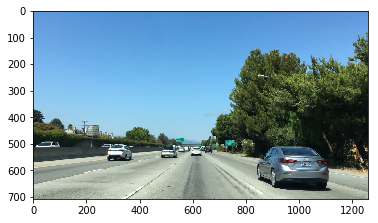

In [2]:
bbox_example_image = cv2.imread('./lesson_images/bbox_example_image.jpg')
bbox_example_image = cv2.cvtColor(bbox_example_image, cv2.COLOR_BGR2RGB)
plt.imshow(bbox_example_image)

## draw_boxes()

A function that takes an image, a list of bounding boxes, an optional color tuple, and optional line thickness as inputs then draws boxes in that color on the output image.

In [3]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # make a copy of the image
    draw_img = np.copy(img)
    # draw each bounding box on your image copy using cv2.rectangle()
    for bbox in bboxes:
        #print('bbox:',bbox)
        #print('bbox[0]:',bbox[0],'bbox[1]:',bbox[1])
        # Draw a rectangle given bbox coordinates.
        cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
    
    # return the image copy with boxes drawn
    return draw_img

## Define and Display Bounding Boxes on an Image
Bounding boxes are defined by a tuple of the top-left and bottom-right corners of each bounding box. Each such tuple represents one bounding box.

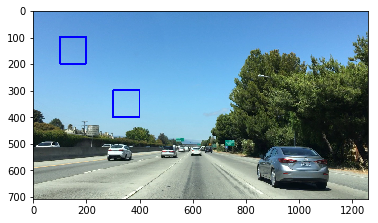

In [4]:
# Add bounding boxes.
bboxes = [((100, 100), (200, 200)), ((300, 300), (400, 400))]

result = draw_boxes(bbox_example_image, bboxes)
plt.imshow(result)

# Vehicle Detection
In order to detect the objects of interest (cars), we need to know what differentiates them from the rest of the image. Color and gradients can be good differentiators. Colors, gradients and more are features that we can use, even a combination of features, that give us the best results (training a classifier and classifying images).

Features and characteristics:
* Template Matching (raw pixel intensity): Color and shape, but it is not robust and does not generalize well.
* Histogram of Color - Spatial Binning (histogram of pixel intensity): Color only
* HOG (Gradients of magnitude and oriented of pixels - gradients of pixel intensity): Shape only

## Feature Extraction Techniques
### Template Matching (raw pixel intensity)
The point of this exercise is not to discover why template matching works for vehicle detection, but rather, why it does not work. Template matching is not a particularly robust method for finding vehicles unless you know exactly what the target object looks like. However, raw pixel values are still quite useful to include in the feature vector in searching for cars.

With template matching, only images where the object of interest is very close to the same orientation, size, and color will be a match to the template. An image template is useful for detecting things that do not vary in their appearance much. For most objects of interest that appear in different forms, orientations, and sizes, this technique dosn't work quite well. In template matching, you depend on raw color values laid out in a specific order and that can vary a lot.

Template matching is not a particularly robust method for finding vehicles unless you now exactly what your target object looks like. However, raw pixel values are still quite useful to include in a feature vector in searching for cars.

#### `find_matches()`
From the Template Matching module. A function that takes in an image and list of templates as inputs, then searches the image and returns a list of bounding boxes.
* Find that the function works well to locate the six example templates taken from the first image.
* Try the code on the second image, and find that the template matching breaks easily.*

In [5]:
def find_matches(img, template_list):
    # Define an empty list to take bbox coords.
    bbox_list = []
    # Define matching method.
    # Other options include: cv2.TM_CCORR_NORMED', 'cv2.TM_CCOEFF',
    # 'cv2.TM_CCORR', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED'.
    method = cv2.TM_CCOEFF_NORMED
    # Iterate through template list.
    for temp in template_list:
        # Read in templates one-by-one.
        tmp = mpimg.imread(temp)
        # Use cv2.matchTemplate() to search the image.
        result = cv2.matchTemplate(img, tmp, method)
        # Use cv2.minMaxLoc() to extract the location of the best match.
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        # Determine a bounding box for the match.
        w, h = (tmp.shape[1], tmp.shape[0])
        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            top_left = min_loc
        else:
            top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)
        # Append bbox position to list.
        bbox_list.append((top_left, bottom_right))
        
    # Return the list of bounding boxes
    return bbox_list

#### Run and Display Output of `find_matches()`

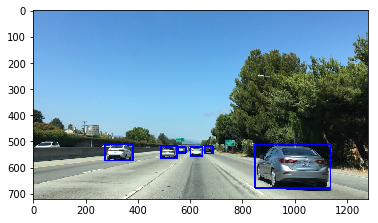

In [6]:
image = mpimg.imread('./lesson_images/cutouts/bbox-example-image.jpg')
# They did not supply the temp-matching-example-2.png image.
#image = mpimg.imread('./lesson_images/cutouts/temp-matching-example-2.png')
templist = ['./lesson_images/cutouts/cutout1.jpg', './lesson_images/cutouts/cutout2.jpg',
            './lesson_images/cutouts/cutout3.jpg', './lesson_images/cutouts/cutout4.jpg',
            './lesson_images/cutouts/cutout5.jpg', './lesson_images/cutouts/cutout6.jpg']

bboxes = find_matches(image, templist)
result = draw_boxes(image, bboxes)
plt.imshow(result)

## Feature Extraction Methods Using Color Spaces, Spatial Binning of Color and Histogram of Oriented Gradient (HOG)...
Given the limitations of template matching, find transformations that are robust to changes in appearance. One such transform is to compute the histogram of color values in an image. When comparing known and unknown images, images with similar color distributions will reveal a close match. This method **removes our dependence on structure (template matching)**; we are no longer sensitive to a perfect arrangement of pixels (template matching), therefore, **objects that appear in slightly different aspects and orientations, will still be matched**. Variations in image size can also be accommodated by **normalizing the histograms**. We are now solely relying on the distribution of color values, which might match some unwanted regions.

### Histograms of Color as Features
A look at histograms of pixel intensity (color histograms) as features.
<span style="color:green"><b>Code Cell 7</b></span>

image.shape: (63, 106, 3)
len(rhist): 2
rhist: (array([400, 441, 302, 244, 189, 283, 412, 433, 239, 177, 209, 302, 276,
       179, 129, 106, 104, 111, 106,  96, 111, 123, 139, 130, 167, 164,
       149, 156, 222, 268, 258,  53]), array([   0.,    8.,   16.,   24.,   32.,   40.,   48.,   56.,   64.,
         72.,   80.,   88.,   96.,  104.,  112.,  120.,  128.,  136.,
        144.,  152.,  160.,  168.,  176.,  184.,  192.,  200.,  208.,
        216.,  224.,  232.,  240.,  248.,  256.]))
bin_edges.shape: (33,)
bin_edges: [   0.    8.   16.   24.   32.   40.   48.   56.   64.   72.   80.   88.
   96.  104.  112.  120.  128.  136.  144.  152.  160.  168.  176.  184.
  192.  200.  208.  216.  224.  232.  240.  248.  256.]


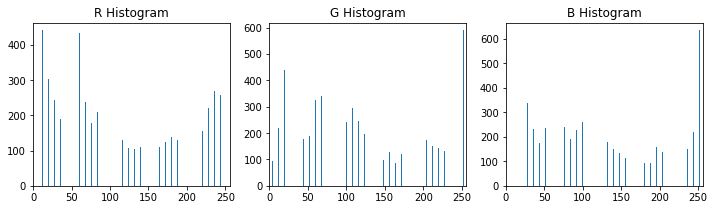

In [7]:
# Read in the image, which is 106x63 pixels for './lesson_images/cutouts/cutout1.jpg'
image = mpimg.imread('./lesson_images/cutouts/cutout1.jpg')
print('image.shape:',image.shape) # (63, 106, 3)

# Take histograms in R, G, and B.
# Returns hist: The values of the histogram. and bin_edges: array of dtype float
rhist = np.histogram(image[:,:,0], bins=32, range=(0, 256)) # a tuple of two arrays
ghist = np.histogram(image[:,:,1], bins=32, range=(0, 256))
bhist = np.histogram(image[:,:,2], bins=32, range=(0, 256))

# Generating bin centers.
bin_edges = rhist[1]
print('len(rhist):',len(rhist))
print('rhist:',rhist)
print('bin_edges.shape:',bin_edges.shape)
print('bin_edges:',bin_edges)
bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2

# Plot a figure with all three bar charts
fig = plt.figure(figsize=(12,3))
plt.subplot(131)
plt.bar(bin_centers, rhist[0])
plt.xlim(0, 256)
plt.title('R Histogram')
plt.subplot(132)
plt.bar(bin_centers, ghist[0])
plt.xlim(0, 256)
plt.title('G Histogram')
plt.subplot(133)
plt.bar(bin_centers, bhist[0])
plt.xlim(0, 256)
plt.title('B Histogram')

#### Concatenate the RGB Histograms to Form the Feature Vector

In [8]:
# Read in the image.
image = mpimg.imread('./lesson_images/cutouts/cutout1.jpg')

# Take histograms in R, G, and B.
rhist = np.histogram(image[:,:,0], bins=32, range=(0, 256))
ghist = np.histogram(image[:,:,1], bins=32, range=(0, 256))
bhist = np.histogram(image[:,:,2], bins=32, range=(0, 256))

hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))

print('len(rhist[0]:)',len(rhist[0]))
print('len(ghist[0]:)',len(ghist[0]))
print('len(bhist[0]:)',len(bhist[0]))
print('len(hist_features:)',len(hist_features))

len(rhist[0]:) 32
len(ghist[0]:) 32
len(bhist[0]:) 32
len(hist_features:) 96


#### `color_hist_0()`
From the HIstograms of Color module. A function that given an image, a particular number of bins, and a pixels' instensity range; computes the RGB color histogram forming a feature; and returns the concatenated RGB feature vector.

Differentiating images by the intensity and range of color they contain can be helpful for looking at car vs non-car images.

In [9]:
def color_hist_0(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    ghist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    bhist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    
    # Return the individual histograms, bin_centers and feature vector
    return hist_features, rhist, ghist, bhist, bin_centers

alternative version, good through Hog Sub-sampling Window Search

#### Run and Display Output of `color_hist_0()` 

<span style="color:green"><b>Code Cell 10</b></span>

Image Shape: (63, 106, 3)
len(feature_vec): 96
feature_vec[0]: 400
feature_vec: [400 441 302 244 189 283 412 433 239 177 209 302 276 179 129 106 104 111
 106  96 111 123 139 130 167 164 149 156 222 268 258  53  95 219 441 331
 235 179 188 324 340 321 252 215 242 296 244 198 133 117  98 127  88 120
 104  88 117 172 152 142 133 159 219 589 106 206 367 337 230 174 235 328
 316 238 189 227 261 271 291 244 179 148 134 112 129 123  94  93 160 138
 117 110 121 148 219 633]

Source Image


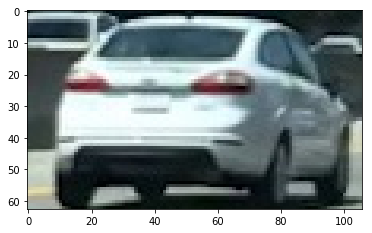

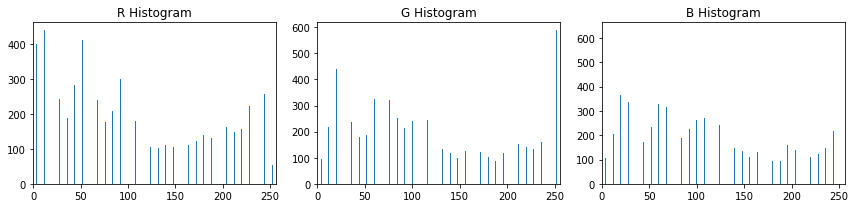

In [10]:
image = mpimg.imread('./lesson_images/cutouts/cutout1.jpg')
# image = mpimg.imread('./lesson_images/ecs_cutouts/vehicles/ecs_vehicle1.png')
feature_vec, rh, gh, bh, bincen = color_hist_0(image, nbins=32, bins_range=(0, 256))

print('Image Shape:',image.shape)
print('len(feature_vec):',len(feature_vec))
print('feature_vec[0]:',feature_vec[0])
print('feature_vec:', feature_vec.ravel())
print()
print('Source Image')
plt.imshow(image)

#Plot a figure with all three bar charts
if rh is not None:
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bincen, rh[0])
    plt.xlim(0, 256)
    plt.title('R Histogram')
    plt.subplot(132)
    plt.bar(bincen, gh[0])
    plt.xlim(0, 256)
    plt.title('G Histogram')
    plt.subplot(133)
    plt.bar(bincen, bh[0])
    plt.xlim(0, 256)
    plt.title('B Histogram')
    fig.tight_layout()
else:
    print('color_hist_0() function is returning None for at least one variable...')
    
    
    
    
# oned_view = resized_image.ravel()
# plt.plot(oned_view)
# plt.title('Spatially Binned Features')



**Plot the feature vector.**
Note that the length of the feature vector is 96 in this case, because there are 32 bins for each RGB color in the image.

Feature Vector from Color Histogram


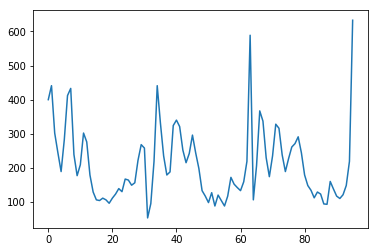

In [11]:
plt.plot(feature_vec.ravel())
print('Feature Vector from Color Histogram')

#### Investigate hist_features (feature_vec) from Previous Result

In [12]:
print('feature_vec.shape:',feature_vec.shape)
print('feature_vec:',feature_vec)

feature_vec.shape: (96,)
feature_vec: [400 441 302 244 189 283 412 433 239 177 209 302 276 179 129 106 104 111
 106  96 111 123 139 130 167 164 149 156 222 268 258  53  95 219 441 331
 235 179 188 324 340 321 252 215 242 296 244 198 133 117  98 127  88 120
 104  88 117 172 152 142 133 159 219 589 106 206 367 337 230 174 235 328
 316 238 189 227 261 271 291 244 179 148 134 112 129 123  94  93 160 138
 117 110 121 148 219 633]


## Explore Color Spaces
With template matching and histograms of color, we still haven't achieved color invariance. Alternate color spaces can make the object of interest stand out against its background. There are properties that we can derive from color values that are common across cars but that distiquish them from the rest of the image. It seems that cars are more saturated in color while the background is generally pale. Perhaps looking at saturation values (from HSV) rather than the raw red, green, blue values (from RGB) from a camera? Regardless of the color or hue of a car, it is likely to have a more prominent appearance.

Examine the distribution of color values in an image by plotting each pixel in some color space.

### Examine Images (64x64)

...
Cutout Images 64x64 Blown-up


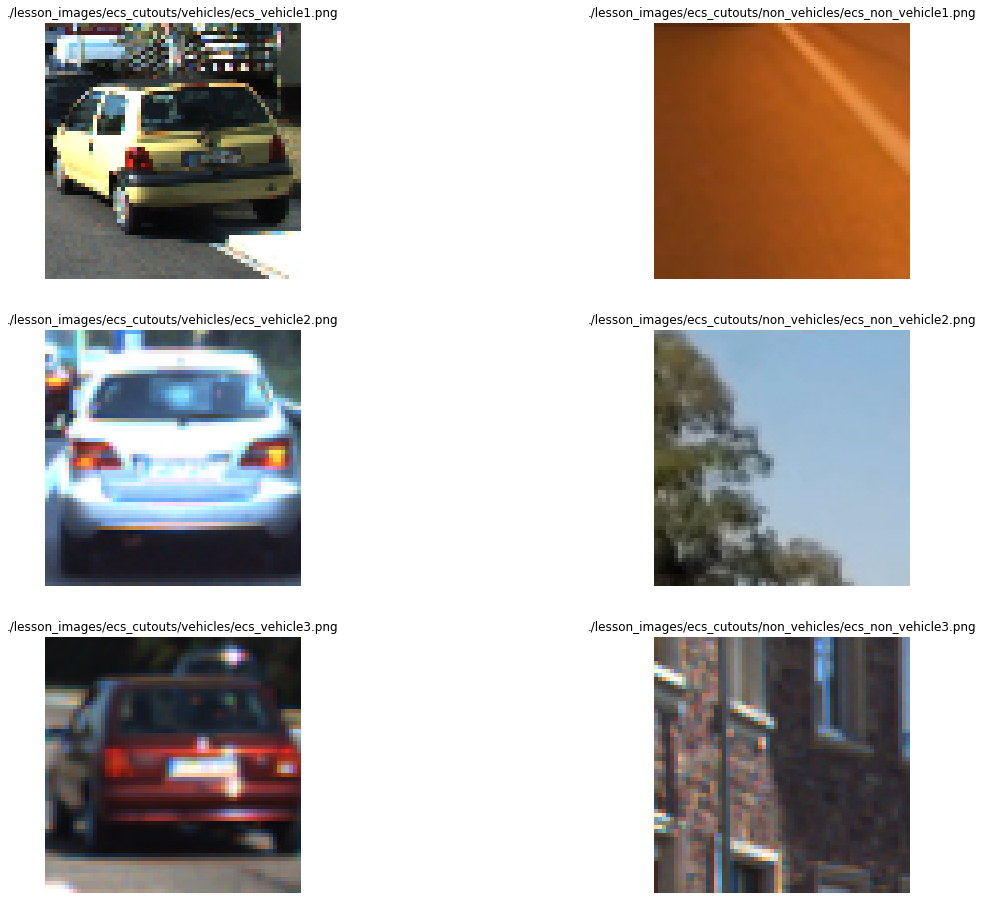

In [13]:
vehicle_images = glob.glob('./lesson_images/ecs_cutouts/vehicles/*.png')
non_vehicle_images = glob.glob('./lesson_images/ecs_cutouts/non_vehicles/*.png')

# Prepare display.
fig, axs = plt.subplots(3,2, figsize=(20, 16))
#fig.subplots_adjust(hspace = .001, wspace=.001)
axs = axs.ravel()

i = 0
j = 0
for vehicle_image_name in vehicle_images:
    vehicle_img = cv2.imread(vehicle_image_name)
    vehicle_img = cv2.cvtColor(vehicle_img, cv2.COLOR_BGR2RGB)
    
    non_vehicle_image_name = non_vehicle_images[j]
    non_vehicle_img = cv2.imread(non_vehicle_image_name)
    non_vehicle_img = cv2.cvtColor(non_vehicle_img, cv2.COLOR_BGR2RGB)
    
    # Draw and display the vehicle images.
    axs[i].axis('off')
    axs[i].set_title(vehicle_image_name)
    axs[i].imshow(vehicle_img)
    i += 1
    # Draw and display the non-vehicle images.
    axs[i].axis('off')
    axs[i].set_title(non_vehicle_image_name)
    axs[i].imshow(non_vehicle_img)
    i += 1
    j += 1
    

print('...')
print('Cutout Images 64x64 Blown-up')

### Examine Images (16x16)

...
Cutout Images 16x16 Blown-up


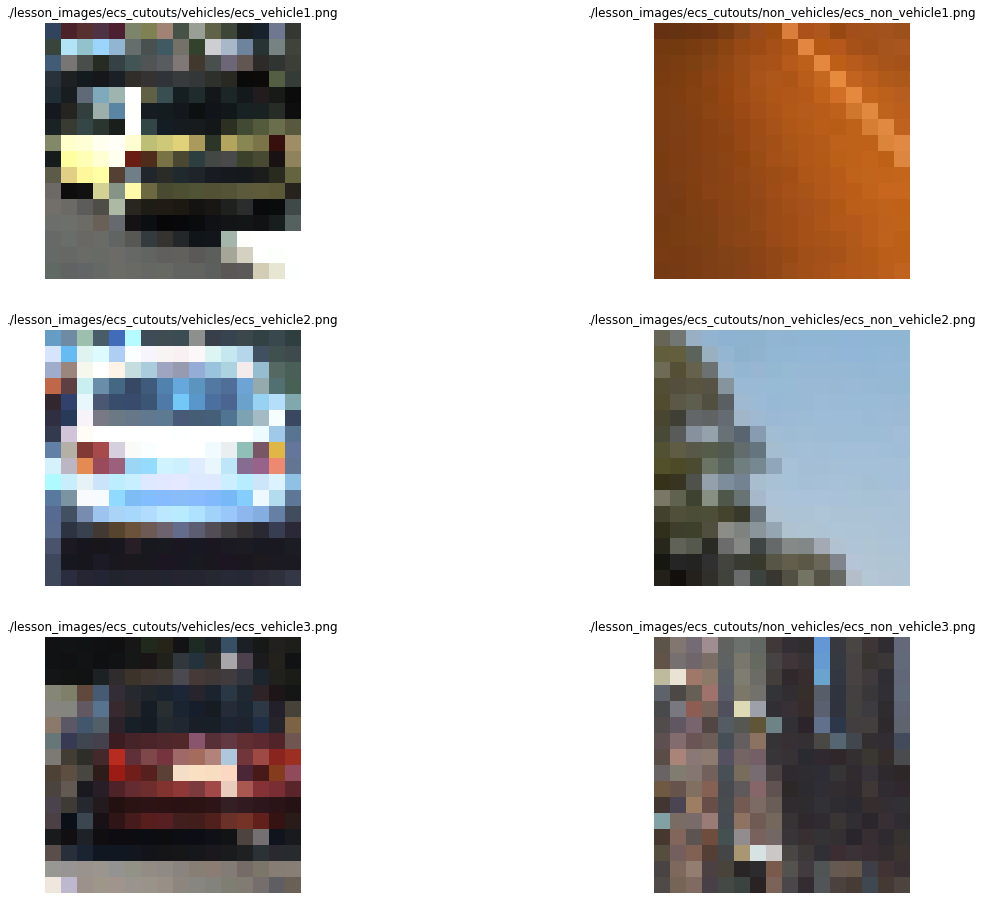

In [14]:
vehicle_images = glob.glob('./lesson_images/ecs_cutouts/vehicles/*.png')
non_vehicle_images = glob.glob('./lesson_images/ecs_cutouts/non_vehicles/*.png')

# Prepare display.
fig, axs = plt.subplots(3,2, figsize=(20, 16))
#fig.subplots_adjust(hspace = .001, wspace=.001)
axs = axs.ravel()

i = 0
j = 0
for vehicle_image_name in vehicle_images:
    vehicle_img = cv2.imread(vehicle_image_name)
    vehicle_img = cv2.cvtColor(vehicle_img, cv2.COLOR_BGR2RGB)
    smaller_vehicle_img = cv2.resize(vehicle_img, (16, 16))
    
    non_vehicle_image_name = non_vehicle_images[j]
    non_vehicle_img = cv2.imread(non_vehicle_image_name)
    non_vehicle_img = cv2.cvtColor(non_vehicle_img, cv2.COLOR_BGR2RGB)
    smaller_non_vehicle_img = cv2.resize(non_vehicle_img, (16, 16))
    
    # Draw and display the vehicle images.
    axs[i].axis('off')
    axs[i].set_title(vehicle_image_name)
    axs[i].imshow(smaller_vehicle_img)
    i += 1
    # Draw and display the non-vehicle images.
    axs[i].axis('off')
    axs[i].set_title(non_vehicle_image_name)
    axs[i].imshow(smaller_non_vehicle_img)
    i += 1
    j += 1
    

print('...')
print('Cutout Images 16x16 Blown-up')

### `plot3d()`
A function that generates 3D plots.

In [15]:
def plot3d(pixels, colors_rgb,
        axis_labels=list("RGB"), axis_limits=[(0, 255), (0, 255), (0, 255)]):
    """Plot pixels in 3D."""

    # Create figure and 3D axes.
    fig = plt.figure(figsize=(8, 8))
    ax = Axes3D(fig)

    # Set axis limits.
    ax.set_xlim(*axis_limits[0])
    ax.set_ylim(*axis_limits[1])
    ax.set_zlim(*axis_limits[2])

    # Set axis labels and sizes.
    ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
    ax.set_xlabel(axis_labels[0], fontsize=16, labelpad=16)
    ax.set_ylabel(axis_labels[1], fontsize=16, labelpad=16)
    ax.set_zlabel(axis_labels[2], fontsize=16, labelpad=16)

    # Plot pixel values with colors given in colors_rgb.
    ax.scatter(
        pixels[:, :, 0].ravel(),
        pixels[:, :, 1].ravel(),
        pixels[:, :, 2].ravel(),
        c=colors_rgb.reshape((-1, 3)), edgecolors='none')

    # Return Axes3D object for further manipulation.
    return ax

### Select an Image to Examine
Try different images of cars and not-cars to see if there is one color space more than another that distiguishes cars from their backgrounds.

Input Image to plot3d()
Image Shape: (64, 64, 3)


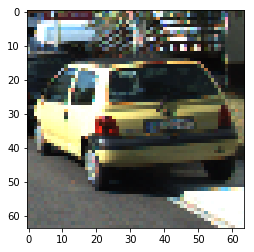

In [16]:
# Read a color image.
img = cv2.imread("./lesson_images/ecs_cutouts/vehicles/ecs_vehicle1.png")

# Select a small fraction of pixels to plot by subsampling it
scale = max(img.shape[0], img.shape[1], 64) / 64  # at most 64 rows and columns
img_small = cv2.resize(img, (np.int(img.shape[1] / scale), np.int(img.shape[0] / scale)), interpolation=cv2.INTER_NEAREST)

# Convert subsampled image to desired color space(s)
img_small_RGB = cv2.cvtColor(img_small, cv2.COLOR_BGR2RGB)  # OpenCV uses BGR, matplotlib likes RGB
img_small_HSV = cv2.cvtColor(img_small, cv2.COLOR_BGR2HSV)
img_small_LUV = cv2.cvtColor(img_small, cv2.COLOR_BGR2LUV)
img_small_HLS = cv2.cvtColor(img_small, cv2.COLOR_BGR2HLS)
img_small_YUV = cv2.cvtColor(img_small, cv2.COLOR_BGR2YUV)
img_small_YCrCb = cv2.cvtColor(img_small, cv2.COLOR_BGR2YCrCb)
img_small_LAB = cv2.cvtColor(img_small, cv2.COLOR_BGR2LAB)
img_small_rgb = img_small_RGB / 255.  # scaled to [0, 1], only for plotting

plt.imshow(img_small_rgb)
print('Input Image to plot3d()')
print('Image Shape:',img_small_rgb.shape)

### Run and Display Output of `plot3d()`

<span style="color:green"><b>Code Cell 17</b></span>

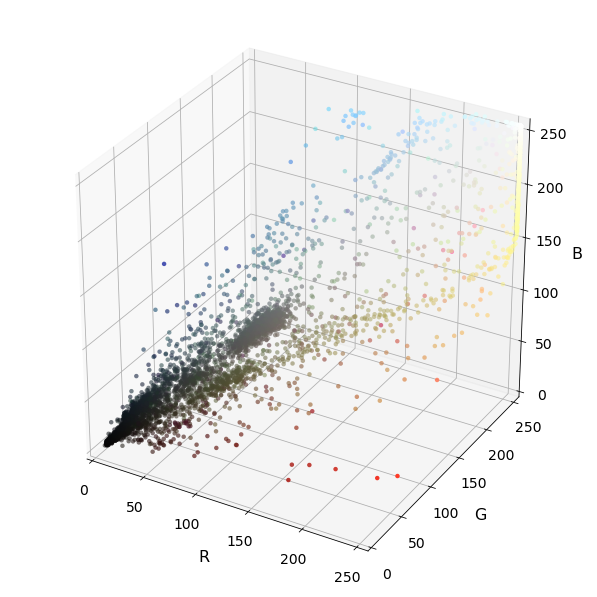

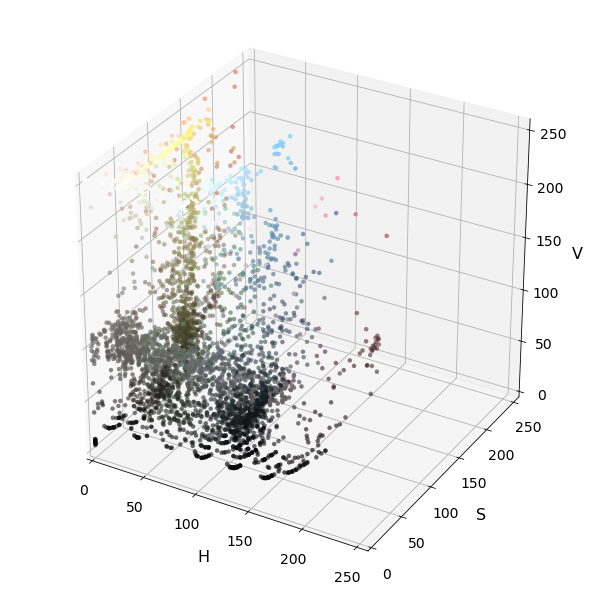

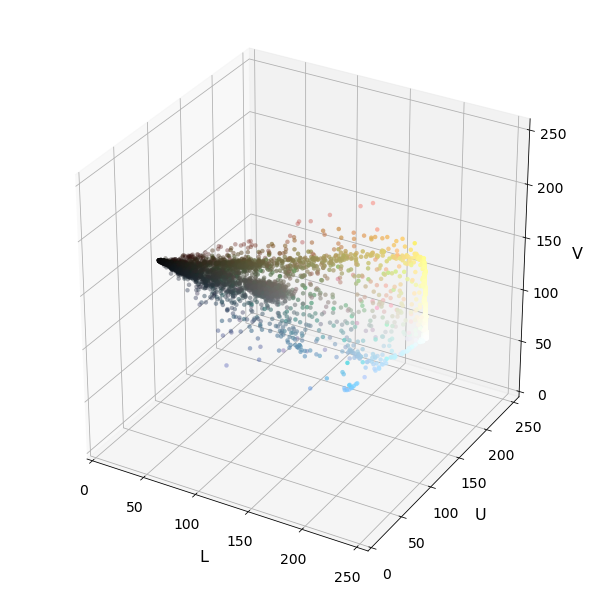

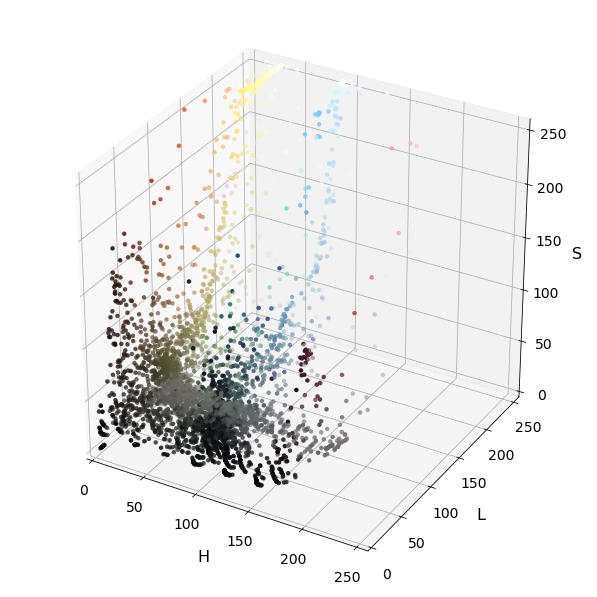

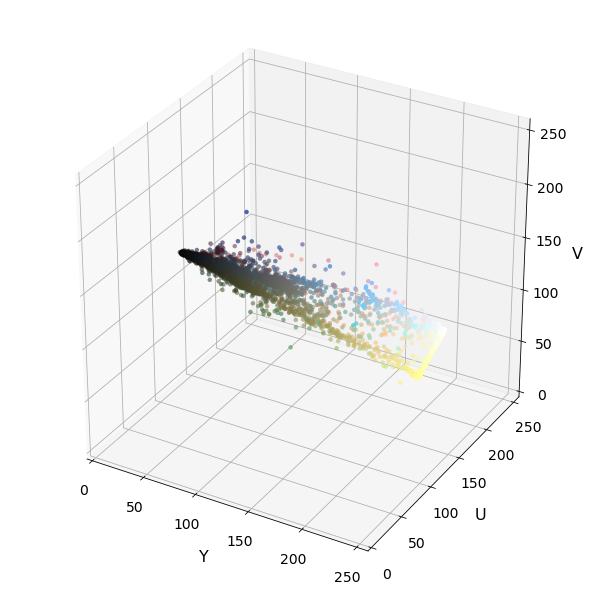

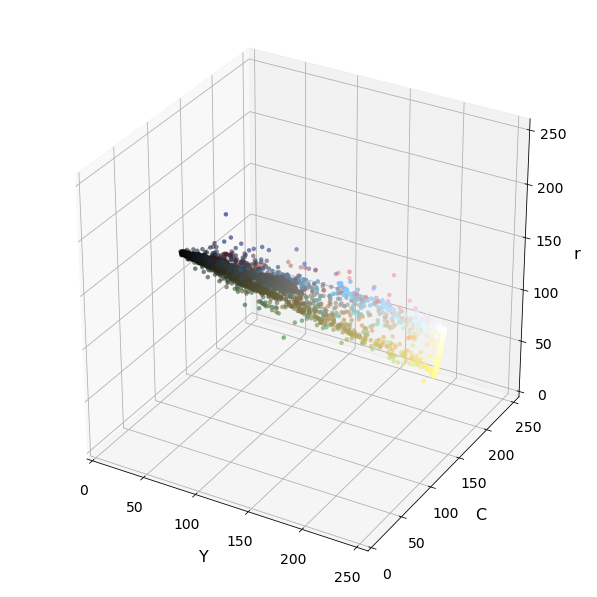

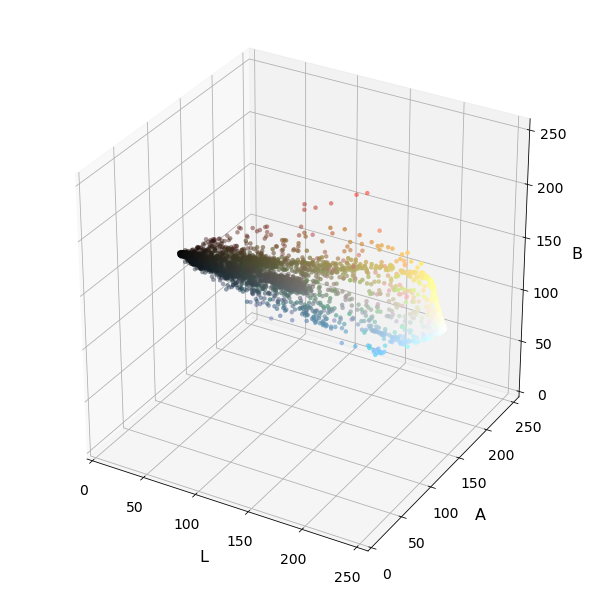

In [17]:
# Plot and show
plot3d(img_small_RGB, img_small_rgb)
plt.show()

plot3d(img_small_HSV, img_small_rgb, axis_labels=list("HSV"))
plt.show()

plot3d(img_small_LUV, img_small_rgb, axis_labels=list("LUV"))
plt.show()

plot3d(img_small_HLS, img_small_rgb, axis_labels=list("HLS"))
plt.show()

plot3d(img_small_YUV, img_small_rgb, axis_labels=list("YUV"))
plt.show()

plot3d(img_small_YCrCb, img_small_rgb, axis_labels=list("YCrCb"))
plt.show()

plot3d(img_small_LAB, img_small_rgb, axis_labels=list("LAB"))
plt.show()

## Spatial Binning of Color
Despite the shorfalls of template matching, raw pixel values are still quite useful to include in the feature vector in searching for cars.

While it could be cumbersome to include three color channels of a full resolution image, performing spatial binning on an image can still retain enough information to help in finding vehicles.

Reducing the images to 32x32 pixel resoltion still preserves relevant features, but 3072 elements (32x32x3) is still quite a few features. Could we get away with even lower resolution?

### `bin_spatial_0()`
From the Spatial Binning of Color module. A function that allows you to convert any test image into a feature vector that can be feed to a classifier. This function takes in an image, a color space conversion, and the resolution to convert it to, and returns a feature vector.

In [18]:
# Define a function to compute color histogram features.
# Pass the color_space flag as 3-letter all caps string
# like 'HSV' or 'LUV' etc.
def bin_spatial_0(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified).
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)  
        
    # Use cv2.resize().ravel() to create the feature vector.
    # ravel returns a 1D version of self, as a view.
    features = cv2.resize(feature_image, size).ravel()
    
    # Return the feature vector.
    return features

early alternative version

later alternative from Hog Sub-sampling Window Search

### Run and Display `bin_spatial_0()` Result

**Select an Image for Input to bin_spatial_0()**

Input Image to bin_spatial_0()
Image Shape: (63, 106, 3)


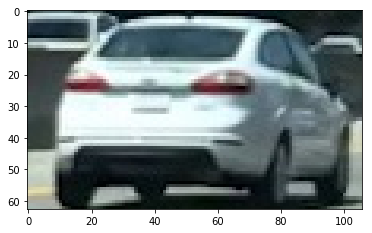

In [19]:
# Read in an image
# You can also read cutout2, 3, 4 etc. to see other examples.
image = mpimg.imread('./lesson_images/cutouts/cutout1.jpg')
# vehicle = mpimg.imread('./lesson_images/ecs_cutouts/vehicles/ecs_vehicle1.png')

plt.imshow(image)
print('Input Image to bin_spatial_0()')
print('Image Shape:',image.shape)

**What does this image look like in a color space other than RGB, say HSV?**

<span style="color:green"><b>Code Cell 20</b></span>

Alternate Color Space Image


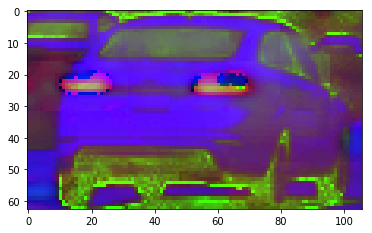

In [20]:
alternate_color_space_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
#alternate_color_space_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
plt.imshow(alternate_color_space_image)
print('Alternate Color Space Image')

**What does this image look like resized?**

Resized Image


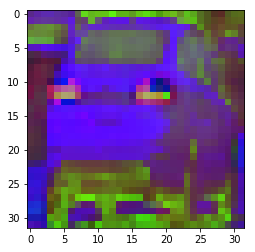

In [21]:
resized_image = cv2.resize(alternate_color_space_image, (32, 32))
plt.imshow(resized_image)
print('Resized Image')

**What does this image look like plotted as a 1D version of self, as a view?

Spatially Binned Features of an Image
len(feature_vec): 3072
feature_vec[0]: 89


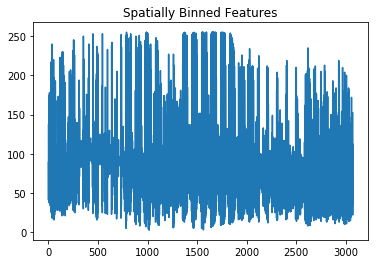

In [22]:
oned_view = resized_image.ravel()
plt.plot(oned_view)
plt.title('Spatially Binned Features')

print('Spatially Binned Features of an Image')
print('len(feature_vec):',len(oned_view))
print('feature_vec[0]:',oned_view[0])

**Display Output of bin_spatial_0()**

Spatially Binned Features of an Image
len(feature_vec): 768
feature_vec[0]: 191


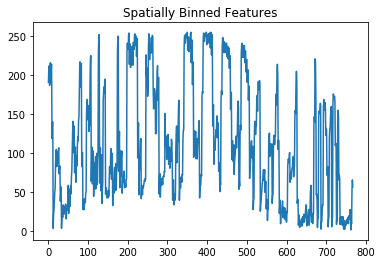

In [23]:
feature_vec = bin_spatial_0(image, color_space='RGB', size=(16, 16))

# Plot features
plt.plot(feature_vec)
plt.title('Spatially Binned Features')

print('Spatially Binned Features of an Image')
print('len(feature_vec):',len(feature_vec))
print('feature_vec[0]:',feature_vec[0])

### Display Images and  Their Spatially Binned Features

...
Cutout Images 16x16 Blown-up


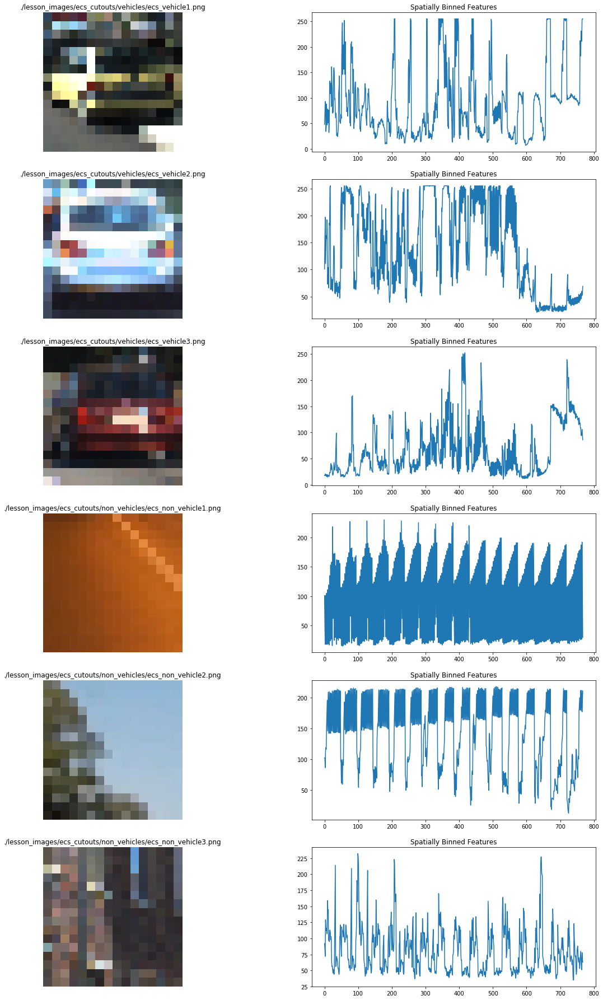

In [24]:
vehicle_images = glob.glob('./lesson_images/ecs_cutouts/vehicles/*.png')
non_vehicle_images = glob.glob('./lesson_images/ecs_cutouts/non_vehicles/*.png')

# Prepare display.
fig, axs = plt.subplots(6,2, figsize=(20, 32))
#fig.subplots_adjust(hspace = .001, wspace=.001)
axs = axs.ravel()

i = 0
j = 0
for vehicle_image_name in vehicle_images:
    vehicle_img = cv2.imread(vehicle_image_name)
    vehicle_img = cv2.cvtColor(vehicle_img, cv2.COLOR_BGR2RGB)
    smaller_vehicle_img = cv2.resize(vehicle_img, (16, 16))
    
    feature_vec = feature_vec = bin_spatial_0(smaller_vehicle_img, color_space='RGB', size=(16, 16))
    
    non_vehicle_image_name = non_vehicle_images[j]
    
    # Draw and display the vehicle images.
    axs[i].axis('off')
    axs[i].set_title(vehicle_image_name)
    axs[i].imshow(smaller_vehicle_img)
    i += 1
    # Draw and display the vehicle feature vec.
    axs[i].set_title('Spatially Binned Features')
    axs[i].plot(feature_vec)
    i += 1
    j += 1
    
j = 0
for non_vehicle_image_name in non_vehicle_images:
    non_vehicle_img = cv2.imread(non_vehicle_image_name)
    non_vehicle_img = cv2.cvtColor(non_vehicle_img, cv2.COLOR_BGR2RGB)
    smaller_non_vehicle_img = cv2.resize(non_vehicle_img, (16, 16))
    
    non_vehicle_feature_vec = bin_spatial_0(smaller_non_vehicle_img, color_space='RGB', size=(16, 16))
    
    # Draw and display the non-vehicle images.
    axs[i].axis('off')
    axs[i].set_title(non_vehicle_image_name)
    axs[i].imshow(smaller_non_vehicle_img)
    i += 1
    # Draw and display the non-vehicle feature vec.
    axs[i].set_title('Spatially Binned Features')
    axs[i].plot(non_vehicle_feature_vec)
    i += 1
    j += 1
    

print('...')
print('Cutout Images 16x16 Blown-up')

# Data Exploration
**The datasets need to be downloaded and installed as siblings to the directory which holds this jupyter notebook as they are not included in the GitHub download of this project.**

We'll use a relatively small labeled dataset to try out feature extraction and training a classifier.

These datasets are comprised of images taken from the [GTI vehicle image database](http://www.gti.ssr.upm.es/data/Vehicle_database.html), the [KITTI vision benchmark suite](http://www.cvlibs.net/datasets/kitti/), and examples extracted from the project video itself.

You are also welcome and encouraged to explore the recently released [Udacity labeled dataset](https://github.com/udacity/self-driving-car/tree/master/annotations). Each of the Udacity datasets comes with a labels.csv file that gives bounding box corners for each object labeled.
## Smaller Dataset
A subset of images...
[vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles_smallset.zip)
and
[non-vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles_smallset.zip).
## Larger Dataset
The complete set of images...
[vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip)
and
[non-vehicles](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip)
## Folder Structure
The vehicles folder comprise the GTI_Far, GTI_Left, GTI_MiddleClose, GTI_Right, and KITTI_extracted folders, which in turn, comprise varied image types as described below.

vehicles folder's subfolders (all of the images are png format):
* GTI_Far: Far away images taken of cars to the left, middle, and right of camera, all in this one folder.
* GTI_Left: Images taken of cars to the left of the camera.
* GTI_MiddleClose: Images taken of cars directly ahead of the camera in close proximity.
* GTI_Right: Images taken of cars to the right of the camera.
* KITTI_extracted: Assorted images taken of cars to the left, middle, and right of the camera, all in this one folder.

Using images from the GTI_Far and KITTI_extracted folders, we do not know the distribution (left, middle, right of camera, near, far) of images. This could bias the training of a classifier as it may see more of some types than of other types.

non-vehicles folder's subfolders (all of the images are png format):
* Extras: Images of non-vehicles from varied perspectives.
* GTI: Images of non-vehicles from varied perspectives.

## Extract the car / not-car image filenames into two lists.
<span style="color:green"><b>Code Cell 25</b></span>

In [25]:
# # Vehicle/Non-vehicle small set.
# vehicle_images = glob.glob('../vehicles_smallset/cars1/*.jpeg')
# non_vehicle_images = glob.glob('../non-vehicles_smallset/notcars1/*.jpeg')
# # print(non_vehicle_images)

# cars = []
# notcars = []

# for vehicle_image in vehicle_images:
#     cars.append(vehicle_image)
    
# for non_vehicle_image in non_vehicle_images:
#     notcars.append(non_vehicle_image)
    
# print(len(cars))
# print(len(notcars))
# print()


cars = []
notcars = []

# Vehicle large set.
vehicle_images = glob.glob('../vehicles/GTI_Far/*.png')
for vehicle_image in vehicle_images:
    cars.append(vehicle_image)
    
vehicle_images = glob.glob('../vehicles/GTI_Left/*.png')
for vehicle_image in vehicle_images:
    cars.append(vehicle_image)
    
vehicle_images = glob.glob('../vehicles/GTI_MiddleClose/*.png')
for vehicle_image in vehicle_images:
    cars.append(vehicle_image)
    
vehicle_images = glob.glob('../vehicles/GTI_Right/*.png')
for vehicle_image in vehicle_images:
    cars.append(vehicle_image)

vehicle_images = glob.glob('../vehicles/KITTI_extracted/*.png')
for vehicle_image in vehicle_images:
    cars.append(vehicle_image)
    
# Non-vehicle large set.
non_vehicle_images = glob.glob('../non-vehicles/Extras/*.png')   
for non_vehicle_image in non_vehicle_images:
    notcars.append(non_vehicle_image)
    
non_vehicle_images = glob.glob('../non-vehicles/GTI/*.png')   
for non_vehicle_image in non_vehicle_images:
    notcars.append(non_vehicle_image)
    
print(len(cars))
print(len(notcars))
print()

# Vehicles
GTI_Far_path = '../vehicles/GTI_Far'
GTI_Left_path = '../vehicles/GTI_Left'
GTI_MiddleClose_path = '../vehicles/GTI_MiddleClose'
GTI_Right_path = '../vehicles/GTI_Right'
KITTI_extracted_path = '../vehicles/KITTI_extracted'
# Non-Vehicles
Extras_path = '../non-vehicles/Extras'
GTI_path = '../non-vehicles/GTI'
# Vehicle images paths.
num_files_GTI_Far = len([f for f in os.listdir(GTI_Far_path)if os.path.isfile(os.path.join(GTI_Far_path, f))])
num_files_GTI_Left = len([f for f in os.listdir(GTI_Left_path)if os.path.isfile(os.path.join(GTI_Left_path, f))])
num_files_GTI_MiddleClose = len([f for f in os.listdir(GTI_MiddleClose_path)if os.path.isfile(os.path.join(GTI_MiddleClose_path, f))])
num_files_GTI_Right = len([f for f in os.listdir(GTI_Right_path)if os.path.isfile(os.path.join(GTI_Right_path, f))])
num_files_KITTI_extracted = len([f for f in os.listdir(KITTI_extracted_path)if os.path.isfile(os.path.join(KITTI_extracted_path, f))])
# Non-vehicles images paths.
num_files_Extras = len([f for f in os.listdir(Extras_path)if os.path.isfile(os.path.join(Extras_path, f))])
num_files_GTI = len([f for f in os.listdir(GTI_path)if os.path.isfile(os.path.join(GTI_path, f))])
# Output results.
print('VEHICLE IMAGES IN LARGE SET')
print('The number of files in...')
print(' GTI_Far:',num_files_GTI_Far)
print(' GTI_Left:',num_files_GTI_Left)
print(' GTI_MiddleClose:',num_files_GTI_MiddleClose)
print(' GTI_Right:',num_files_GTI_Right)
print(' KITTI_extracted:',num_files_KITTI_extracted)
total_num_vehicle_images = num_files_GTI_Far + num_files_GTI_Left + num_files_GTI_MiddleClose + num_files_GTI_Right + num_files_KITTI_extracted
print('The total number of vehicle images:', total_num_vehicle_images)
print()
print('NON-VEHICLE IMAGES IN LARGE SET')
print('The number of files in...')
print(' Extras:',num_files_Extras)
print(' GTI:',num_files_GTI)
total_num_non_vehicle_images = num_files_Extras + num_files_GTI
print('The total number of non-vehicle images:', total_num_non_vehicle_images)
print()
smaller_total_num = min(total_num_vehicle_images, total_num_non_vehicle_images)
larger_total_num = max(total_num_vehicle_images, total_num_non_vehicle_images)
if smaller_total_num == larger_total_num:
    print('The datasets are balanced.')
else:
    print('The smaller chosen dataset is within %.2f%% of the larger chosen dataset.'%(100*(larger_total_num - smaller_total_num)/larger_total_num))

8792
8968

VEHICLE IMAGES IN LARGE SET
The number of files in...
 GTI_Far: 835
 GTI_Left: 910
 GTI_MiddleClose: 420
 GTI_Right: 665
 KITTI_extracted: 5967
The total number of vehicle images: 8797

NON-VEHICLE IMAGES IN LARGE SET
The number of files in...
 Extras: 5069
 GTI: 3901
The total number of non-vehicle images: 8970

The smaller chosen dataset is within 1.93% of the larger chosen dataset.


## `data_look()`
From the Data Exploration module. A function to return characteristics of the dataset.

<span style="color:green"><b>Code Cell 26</b></span>

In [26]:
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    example_img = mpimg.imread(car_list[0])
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = example_img.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = example_img.dtype
    
    # Return data_dict
    return data_dict

<span style="color:green"><b>Code Cell 27</b></span>

In [27]:
data_info = data_look(cars, notcars)

print('data_look returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])

data_look returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32


<span style="color:green"><b>Code Cell 28</b></span>

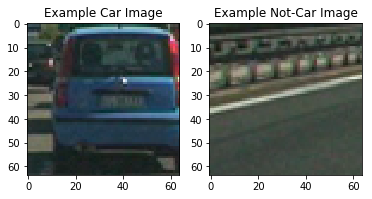

In [28]:
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Not-Car Image')

# Data Preparation
Data preparation step and purpose:
* Prepare a balanced dataset, i.e., have as many positive as negative examples, or in the case of multi-class problems, roughly the same number of cases of each class: To avoid having the algorithm simply classify everything as belonging to the majority class.
* Random shuffling of the data: To avoid problems due to ordering of the data
* Splitting the data into a training and testing set: To avoid overfitting / improve generalization
* Nomalization of features, typically to zero mean and unit variance: To avoid features or sets of features dominating the response of the classifier.

## Gradient Features
So far, we've been manipulating and tracking color values. But, they only capture one aspect of an object's appearance. When you have a class of objects that can vary in color, structural queues like gradients or edges, might give you a more robust representation. In fact, the presence of gradients in specific directions around the center may actually capture some notion of shape. Ideally, the gradient signature for a shape should have enough flexibility to accommodate small variations in orientation, size, etc., but it should also be distinct so that it can be used to distiquish between shapes. Using gradient values directly makes the signature too sensitive. But, there is a way to allow for some variability.

Compute the gradient magnitudes and directions for an image at each pixel. Instead of using these individual values, group them into small cells and compute a histogram of gradient directions, or, orientations, from each of the pixels within the cell. The gradient samples are then distributed into orientation bins and summed-up. The bin witht he most entries represents the dominant gradient direction for the cell. Note that the histogram is not strictly a count of the number of samples in each direction. Instead, the gradient magnitude of each pixel is summed. With this, stronger gradients contribute more weight to their orientation bin and the effect of small, random gradients due to noise, etc., is reduced. In other words, each pixel in the image gets a vote on which histogram bin it belongs in based on the gradient direction at that position. But the strength, or, weight, of that vote depends on the gradient magnitude at that pixel.

Something like this can be used as a signature for a given shape. This is known as a histogram of oriented gradients (HOG) or HOG feature.

The main advantage now is that the ability to accept small variations in the shape while keeping the signature distinct enough.

How accommodating or sensitive the featue is can be tweaked by varying parameters such as:
* The number of orientation bins
* Grid of cells
* Cell sizes
* Adding overlap between cells
* Block normalization (normalizing for intensity across small blocks of cells)

### Histogram of Oriented Gradients (HOG)
The scikit-image package has a built-in function to extract Histogram of Oriented Gradient features. The documentation for this function can be found [here](http://scikit-image.org/docs/dev/api/skimage.feature.html?highlight=feature%20hog#skimage.feature.hog) and a brief explanation of the algorithm and tutorial can be found [here](http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html).

The scikit-image `hog()` function **takes in a single color channel or grayscaled image as input**, as well as various parameters.

The number of `orientations` is specified as an integer, and represents the number of orientation bins that the gradient information will be split up into in the histogram. Typical values are between 9 and 12 bins.

The `pixels_per_cell` parameter specifies the cell size over which each gradient histogram is computed. This parameter is passed as a 2-tuple so you could have different cell sizes in x and y, but cells are commonly chosen to be square.

Teh `cells_per_block` parameter is also passed as a 2-tuple, and specifies the local area over which the histogram counts in a given cell will be normalized. Block normalization is not necessarily required, but generally leads to a more robust feature set.

There is another optional power law or "gamma" normalization scheme set by the flag `transform_sqrt`. This type of normalization may help reduce the effects of shadows or other illumination variation, but will cause an error if your image contains negative values (because it's taking the square root of image values).

The `visualise=True` flag tells the function to output a visualization of the HOG feature computation as well. The HOG visualization is not actually the feature vector, but rather, a representation that shows the dominant gradient direction within each cell with brightness corresponding to the strength of gradients in that cell.

Setting the `feature_vector` flag to `True` when calling the `hog()` function will automatically unroll the features vector. If not, the shape of the array will be grid size of the blocks, times the grid size of the cells in each block, times the number of orientations per cell.

**Note:** The actual number of features in the final feature vector, will be the total number of block positions multiplied by the number of cells per block, thimes the number of orientations.

#### `get_hog_features()`
From the scikit-image HOG module. A function that returns either features or features and the HOG image given an input image, the number of gradient orientation bins, the number of pixels per cell, the number of cells per block, the visibility desired (whether or not to return the HOG image), 



In [29]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        # if... return features and hog image.
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, visualise=vis, feature_vector=feature_vec)
        
        return features, hog_image
    else:  
        # else... return features, only.
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        
        return features

#### Run and Display `get_hog_features()` for a Random Car Image

<span style="color:green"><b>Code Cell 30</b></span>

scikit_image HOG Lesson


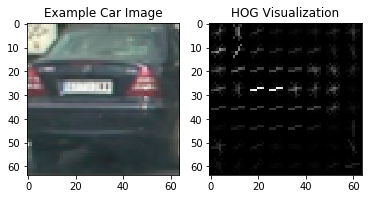

In [30]:
# Generate a random index to look at a car image.
ind = np.random.randint(0, len(cars))

# Read in the image.
image = mpimg.imread(cars[ind])
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Define HOG parameters.
orient = 9
pix_per_cell = 8
cell_per_block = 2

# Call get_hog_features() with vis=True to see an image output.
features, hog_image = get_hog_features(gray, orient, pix_per_cell, cell_per_block, vis=True, feature_vec=False)

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Visualization')
print('scikit_image HOG Lesson')

# Combining and Normalizing Features (Color and Shape)
It is not necessary to use only one type of feature for object detection. Combine features derived form color and shape to form a more robust and useful feature. Color and shape complement each other with regard to the information they capture about an object.

Be careful when combining features; **normalizin**g the individual features prior to combining them may prevent one feature type from dominating another in later stages. Additionally, there might be a lot more elements of one type of feature than another. This may or may not be a problem in itself, but it's generally a good idea to see if there are any redundancies in the combined feature vector. For instance, a **decision tree** could be implemented to analyze the relative importance of features and drop the ones that are not contributing much.

Python's `sklearn` package provides the `StandardScaler()` method to accomplish normalization of data. To read more about choosing different normalizations with the `StandardScaler()` method, check out the [documentation](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html).

To apply `StandardScaler()` the data has to be in the format of a numpy array where each row is a single feature vector. **Note:** `StandardScaler()` expects *np.float64*.

A list of feature vectors can be converted to the format of a numpy array using the `vstack()` and `astype()` numpy functions. `vstack(tup)` takes a sequence of arrays and stacks them vertically to make a single array where `tup` is a tuple containing arrays to be stacked. The arrays must have the same shape along all but the first axis.
## A Series of Extract Functions
## extract_features_sbc_hist()
From the Color Classify module. A function to extract features from a list of images. This version only uses color histograms and spatially binned color. Recall that color histograms 

**This function calls `color_hist_0()` and `bin_spatial_0()`.**

<span style="color:green"><b>Code Cell 31</b></span>

In [31]:
def extract_features_sbc_hist(imgs, cspace='RGB', spatial_size=(32, 32),
                     hist_bins=32, hist_range=(0, 256)):
    # Create a list to which to append feature vectors.
    features = []
    # Iterate through the list of images.
    print_feature_information = True
    for file in imgs:
        # Read in each image, one-by-one.
        image = mpimg.imread(file)
        # Apply a color conversion if other than 'RGB'.
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        else: feature_image = np.copy(image)
            
        # Apply bin_spatial_0() to get spatial color features.
        spatial_features = bin_spatial_0(feature_image, size=spatial_size)
        # Apply color_hist_0() also with a color space option now.
        hist_features, rhist, ghist, bhist, bin_centers = color_hist_0(feature_image, nbins=hist_bins, bins_range=hist_range)
        # Append the new feature vector to the features list.
#         features.append(np.concatenate((spatial_features, hist_features)))
        color_features = np.concatenate((spatial_features, hist_features))
        features.append(color_features)
        
        
        if print_feature_information:
            print('*****Feature Information Using Color Histograms and Spatially Binned Color Feature Extraction')
            print('len(spatial_features):',len(spatial_features))
            print('spatial feature:',spatial_features)
            print()
            print('len(hist_features):',len(hist_features))
            print('hist feature:',hist_features)
            print()
            print('len(color_features:):',len(color_features))
            print('color_features:',color_features)
            print()
            print('len(features):',len(features))
            print('features:',features)
            print()
            print('len(features[0]):',len(features[0]))
            print('features[0]:',features[0])
            print('*****End of Feature Information')
            print_feature_information = False
        
    # Return list of feature vectors
#     return np.asarray(features)
    return features

## `extract_features_hog()`
From the HOG Classify module. This version only uses HOG features.

<span style="color:green"><b>Code Cell 32</b></span>

In [32]:
def extract_features_hog(imgs, cspace='RGB', orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    print_feature_information = True
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        features.append(hog_features)
        
        if print_feature_information:
            print('*****Feature Information Using Histogram of Orientation Gradients (HOG) Feature Extraction')
            print('len(hog_features):',len(hog_features))
            print('hog_features:',hog_features)
            print()
            print('len(features):',len(features))
            print('features:',features)
            print()
            print('len(features[0]):',len(features[0]))
            print('features[0]:',features[0])
            print('*****End of Feature Information')
            print_feature_information = False
        
    # Return list of feature vectors
    return features

## `extract_features_sbc_hist_hog()`
From the Search and Classify module. This version uses spatially binned color and color histograms and HOG features.

In [33]:
def extract_features_sbc_hist_hog(imgs):
    # Arguments
    color_conv='RGB'#RGB2YCrCb'
    bin_spatial_size=(32, 32)
    nhist_bins=32
    orient=9
    pix_per_cell=8
    cell_per_block=2
    hog_channel=0
    #vis=False
    #feature_vec=True
    
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    print_feature_information = True
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        
        # COLOR
        # Apply color conversion.
        if color_conv == 'RGB2HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_conv == 'RGB2LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_conv == 'RGB2HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_conv == 'RGB2YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_conv == 'RGB2YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        elif color_conv == 'RGB2YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        elif color_conv == 'RGB2LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        else: feature_image = np.copy(image)

        # BIN_SPATIAL
        # Apply bin_spatial_0() to get spatial color features.
        #spatial_features = bin_spatial_0(feature_image, size=spatial_size)
        color1 = cv2.resize(feature_image[:,:,0], bin_spatial_size).ravel()
        color2 = cv2.resize(feature_image[:,:,1], bin_spatial_size).ravel()
        color3 = cv2.resize(feature_image[:,:,2], bin_spatial_size).ravel()
        # Stack the colors into a single feature vector.
        bin_spatial_features = np.hstack((color1, color2, color3))

        # COLOR_HIST
        # Apply color_hist_0() also with a color space option now.
        #hist_features, rhist, ghist, bhist, bin_centers = color_hist_0(feature_image, nbins=hist_bins, bins_range=hist_range)
        # Compute the histogram of the color channels separately
        channel1_hist = np.histogram(feature_image[:,:,0], bins=nhist_bins)
        channel2_hist = np.histogram(feature_image[:,:,1], bins=nhist_bins)
        channel3_hist = np.histogram(feature_image[:,:,2], bins=nhist_bins)
        # Concatenate the histograms into a single feature vector.
        color_hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
        
#         color_features = np.concatenate((bin_spatial_features, color_hist_features))
#         APPEND
#         Append the new feature vector to the features list.
#         features.append(np.concatenate((bin_spatial_features, color_hist_features)))
#         np.concatenate(bin_spatial_features, color_hist_features)

        # GET_HOG_FEATURES
        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            
#         feature = np.hstack(bin_spatial_features,color_hist_features,hog_features)

        total_combined_features = np.concatenate((bin_spatial_features, color_hist_features, hog_features))

#         APPEND
#         Append the new feature vector to the features list
#         features.append(np.concatenate((features, hog_features)))
#         features.append(feature)

        features.append(total_combined_features)
        
        if print_feature_information:
            print('*****Feature Information Using a Combination of All Feature Extraction Techniques')
            print('len(bin_spatial_features):',len(bin_spatial_features))
            print('spatial feature:',bin_spatial_features)
            print()
            print('len(color_hist_features):',len(color_hist_features))
            print('color_hist_features:',color_hist_features)
            print()
            print('len(hog_features):',len(hog_features))
            print('hog_features:',hog_features)
            print()
            print('len(features):',len(features))
            print('features:',features)
            print()
            print('len(features[0]):',len(features[0]))
            print('features[0]:',features[0])
            print('*****End of Feature Information')
            print_feature_information = False

    # Return list of feature vectors
    return features

The following cell is for reference; it is a good collection of information and was used to build the function above.

# Define and Train a Linear Support Vector Machine Classifier (SVM)
**The information in the next few cells is used in processing and analyzing the success of various feature extraction methods. It is shown here as a reference.**

Steps to train a classifier:
* Read in the car and non-car images
* Extract the features for the car and non-car images, creating feature vectors
* Scale the feature vectors to zero mean and unit variance
* Create a labels vector (1's for cars; 0's for non-cars)

### Stack and Scale (normalize) Feature Vectors

### Split Datasets Into Randomzed Training and Test Sets

### Define and Train a Classifier
Using a Linear Support Vector Machine.

### Check the Accuracy of the Classifier on the Test Dataset

### Make Predictions on a Subset of the Test Data and Compare Directly with Ground Truth

# Experiment With the Above, Varied Feature Extraction Methods

## `analyze_and_output()`
Given car and not-car features, analyzes the features, outputs results and makes a determination.

<span style="color:green"><b>Code Cell 34</b></span>

In [34]:
def analyze_and_output(car_features, notcar_features,
                       cspace=None,orient=None,
                       pix_per_cell=None,cell_per_block=None,hog_channel=None):
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))
    # np.vstack(tup) Stacks arrays in sequence vertically (row wise). Takes a sequence of
    # arrays and stacks them vertically to make a single array.
    # Create an array stack of feature vectors.
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler.
    X_scaler = StandardScaler().fit(X)
    print(X_scaler)
    # Apply the scaler to X.
    # scaled_X contains the normalized feature vectors.
    scaled_X = X_scaler.transform(X)
    
#     print()
#     print('X.shape:',X.shape)
#     print('X[0]:',X[0])
#     print('X[1]:',X[1])
#     print('X[0].shape:',X[0].shape)
#     print('X[1].shape:',X[1].shape)
#     print('len(X[0]):',len(X[0]))
#     print('X[0][1]:',X[0][1])
#     print('X[0][1].shape:',X[0][1].shape)
    
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

    print('values:',cspace,orient,pix_per_cell,cell_per_block,hog_channel)
    if orient and pix_per_cell and cell_per_block and cspace:
        print('USING ONLY HOG FEATURES')
        print('Using:',cspace,'color space',orient,'orientations',pix_per_cell,'pixels per cell and', cell_per_block,'cells per block and hog channel(s)', hog_channel)
    else:
        print('USING ONLY COLOR FEATURES')
        
    print()
    
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    # Check the prediction time for a single sample
    t=time.time()
    n_predict = 10
    print('The SVC predicts:    ', svc.predict(X_test[0:n_predict]))
    print('for these',n_predict, 'labels: ', y_test[0:n_predict])
    t2 = time.time()
    print(round(t2-t, 5), 'seconds to predict', n_predict,'labels with SVC')
    
    # Display a random car, raw features, scaled features.
    print()
    print('A random car, its raw features, its scaled featues...')
    car_ind = np.random.randint(0, len(cars))
    
    # Plot an example of raw and scaled features.
    fig = plt.figure(figsize=(12,4))
    
    plt.subplot(131)
    plt.imshow(mpimg.imread(cars[car_ind]))
    plt.title('Original Image')
    
    plt.subplot(132)
    plt.plot(X[car_ind])
    plt.title('Raw Features')
    
    plt.subplot(133)
    plt.plot(scaled_X[car_ind])
    plt.title('Normalized Features')
    
    fig.tight_layout()
    
    # Is the random image a car? - It should be, since a car image was selected for prediction.
    print()
    if svc.predict(scaled_X[car_ind].reshape(1,-1)):
        print('The SVC predicts this is a car.')
    else:
        print('The SVC predicts this is not a car.')
        
    return X_scaler, svc

## Color Classify
Train a classifier on the dataset using spatially binned color and histogram of color features.
### Run and Display Results of  `extract_features_sbc_hist()`

**Extract Features**

In [35]:
car_features = extract_features_sbc_hist(cars, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256))
notcar_features = extract_features_sbc_hist(notcars, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256))

*****Feature Information Using Color Histograms and Spatially Binned Color Feature Extraction
len(spatial_features): 3072
spatial feature: [ 0.61176473  0.65882355  0.63921571 ...,  0.63137257  0.63137257
  0.55686277]

len(hist_features): 96
hist feature: [4096    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0 4096    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0 4096    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0]

len(color_features:): 3168
color_features: [ 0.61176473  0.65882355  0.63921571 ...,  0.          0.          0.        ]

len(features): 1
features: [array([ 0.61176473,  0.65882355,  0.63921571, ...,  0.        ,
        0.        ,  0.        ])]

len

**Process and Display Results**

StandardScaler(copy=True, with_mean=True, with_std=True)
values: None None None None None
USING ONLY COLOR FEATURES

Feature vector length: 3168
34.84 Seconds to train SVC...
Test Accuracy of SVC =  0.9023
The SVC predicts:     [ 0.  0.  1.  0.  0.  0.  0.  1.  1.  0.]
for these 10 labels:  [ 0.  0.  1.  0.  0.  0.  0.  1.  1.  0.]
0.00398 seconds to predict 10 labels with SVC

A random car, its raw features, its scaled featues...

The SVC predicts this is a car.


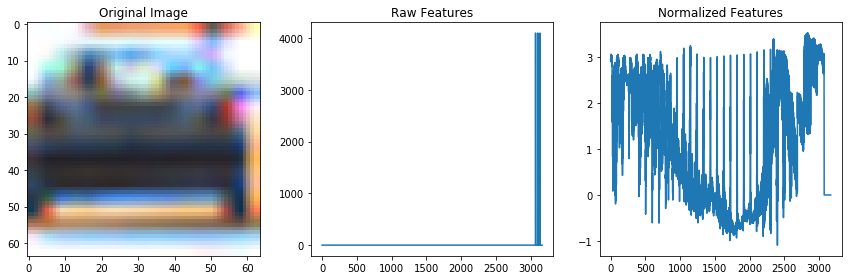

In [36]:
X_scaler, svc = analyze_and_output(car_features,notcar_features)

## HOG Classify
Extract histogram of oriented gradients (HOG) features and train a linear SVM.
### Run and Display Results of  `extract_features_hog()`
** `extract_features_hog()` is an inefficient method for extracting HOG features.**

In [37]:
# Adjust these parameters and see how the results change.
colorspace = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0 # Can be 0, 1, 2, or "ALL"

In [38]:
car_features = extract_features_hog(cars, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
notcar_features = extract_features_hog(notcars, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)

*****Feature Information Using Histogram of Orientation Gradients (HOG) Feature Extraction
len(hog_features): 1764
hog_features: [ 0.03020912  0.02691341  0.00498283 ...,  0.00244015  0.00084581  0.        ]

len(features): 1
features: [array([ 0.03020912,  0.02691341,  0.00498283, ...,  0.00244015,
        0.00084581,  0.        ])]

len(features[0]): 1764
features[0]: [ 0.03020912  0.02691341  0.00498283 ...,  0.00244015  0.00084581  0.        ]
*****End of Feature Information
*****Feature Information Using Histogram of Orientation Gradients (HOG) Feature Extraction
len(hog_features): 1764
hog_features: [ 0.15409536  0.02855924  0.04948971 ...,  0.01808569  0.01030326
  0.04070969]

len(features): 1
features: [array([ 0.15409536,  0.02855924,  0.04948971, ...,  0.01808569,
        0.01030326,  0.04070969])]

len(features[0]): 1764
features[0]: [ 0.15409536  0.02855924  0.04948971 ...,  0.01808569  0.01030326
  0.04070969]
*****End of Feature Information


StandardScaler(copy=True, with_mean=True, with_std=True)
values: RGB 9 8 2 0
USING ONLY HOG FEATURES
Using: RGB color space 9 orientations 8 pixels per cell and 2 cells per block and hog channel(s) 0

Feature vector length: 1764
8.27 Seconds to train SVC...
Test Accuracy of SVC =  0.9347
The SVC predicts:     [ 0.  1.  1.  1.  1.  1.  1.  1.  0.  0.]
for these 10 labels:  [ 0.  1.  1.  1.  0.  1.  1.  1.  0.  0.]
0.00358 seconds to predict 10 labels with SVC

A random car, its raw features, its scaled featues...

The SVC predicts this is a car.


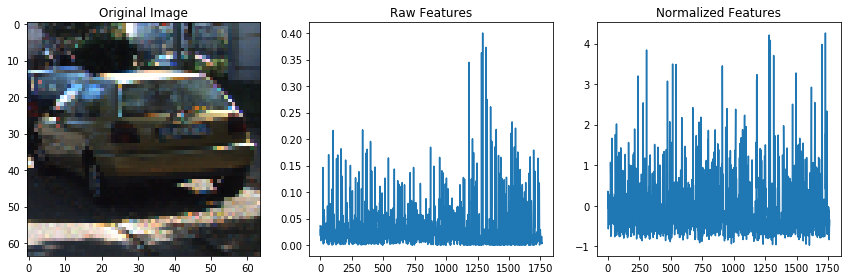

In [39]:
X_scaler, svc = analyze_and_output(car_features,notcar_features,colorspace,orient,pix_per_cell,cell_per_block,hog_channel)

## Color and HOG Classify
Extract spatially binned color, histogram of color, and histogram of oriented gradients (HOG) features and train a linear SVM.

<span style="color:green"><b>Code Cell 40</b></span>

In [40]:
car_features = extract_features_sbc_hist_hog(cars)
notcar_features = extract_features_sbc_hist_hog(notcars)

*****Feature Information Using a Combination of All Feature Extraction Techniques
len(bin_spatial_features): 3072
spatial feature: [ 0.61176473  0.60980392  0.60196078 ...,  0.56666672  0.54705882
  0.55686277]

len(color_hist_features): 96
color_hist_features: [ 22 219 233 217 242 312 276 271 219 190 164 146 118 115 100  77 112 177
 238 217 144  49  47  30  28  42  18  14  13  15  19  12  17  95 284 275
 217 182 198 249 293 244 202 134 111 122 113 125 101 211 287 173 122  58
  53  49  37  45  30  19  15   8  17  10  10  20  69 131 222 277 236 190
 177 254 254 329 225 243 107 144 156 213 302 106  99  36  44  57  49  32
  25  29  24   9  16  11]

len(hog_features): 1764
hog_features: [ 0.03020912  0.02691341  0.00498283 ...,  0.00244015  0.00084581  0.        ]

len(features): 1
features: [array([ 0.61176473,  0.60980392,  0.60196078, ...,  0.00244015,
        0.00084581,  0.        ])]

len(features[0]): 4932
features[0]: [ 0.61176473  0.60980392  0.60196078 ...,  0.00244015  0.0008458

<span style="color:green"><b>Code Cell 41</b></span>

StandardScaler(copy=True, with_mean=True, with_std=True)
values: None None None None None
USING ONLY COLOR FEATURES

Feature vector length: 4932
15.93 Seconds to train SVC...
Test Accuracy of SVC =  0.9772
The SVC predicts:     [ 1.  0.  1.  1.  1.  0.  0.  1.  0.  1.]
for these 10 labels:  [ 1.  0.  1.  1.  1.  0.  0.  1.  0.  1.]
0.00426 seconds to predict 10 labels with SVC

A random car, its raw features, its scaled featues...

The SVC predicts this is a car.


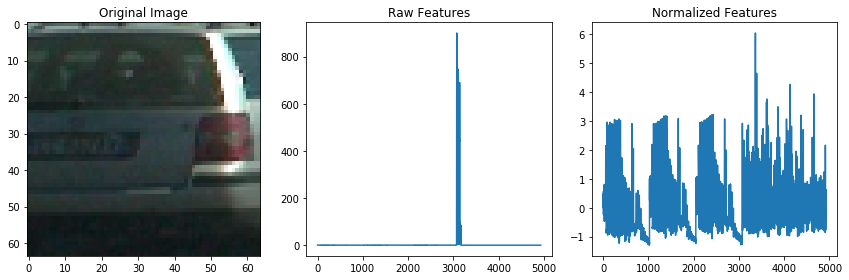

In [41]:
X_scaler, svc = analyze_and_output(car_features,notcar_features)

# Sliding Windows
## `slide_window()`
A function that takes in an image, start and stop positions in both x and y (imagine a bounding box for the entire search region), window size (x and y dimensions), and overlap fraction (also for both x and y) and returns a list of bounding boxes for the search windows, which will then be passed to the `draw_boxes()` function.

<span style="color:green"><b>Code Cell 42</b></span>

In [42]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
            
    # Return the list of windows
    return window_list

## Run and Display Results of `slide_window()`

<span style="color:green"><b>Code Cell 43</b></span>

Number of windows: 13
[((264, 510), (328, 574)), ((296, 510), (360, 574)), ((328, 510), (392, 574)), ((360, 510), (424, 574)), ((392, 510), (456, 574)), ((424, 510), (488, 574)), ((456, 510), (520, 574)), ((488, 510), (552, 574)), ((520, 510), (584, 574)), ((552, 510), (616, 574)), ((584, 510), (648, 574)), ((616, 510), (680, 574)), ((648, 510), (712, 574))]


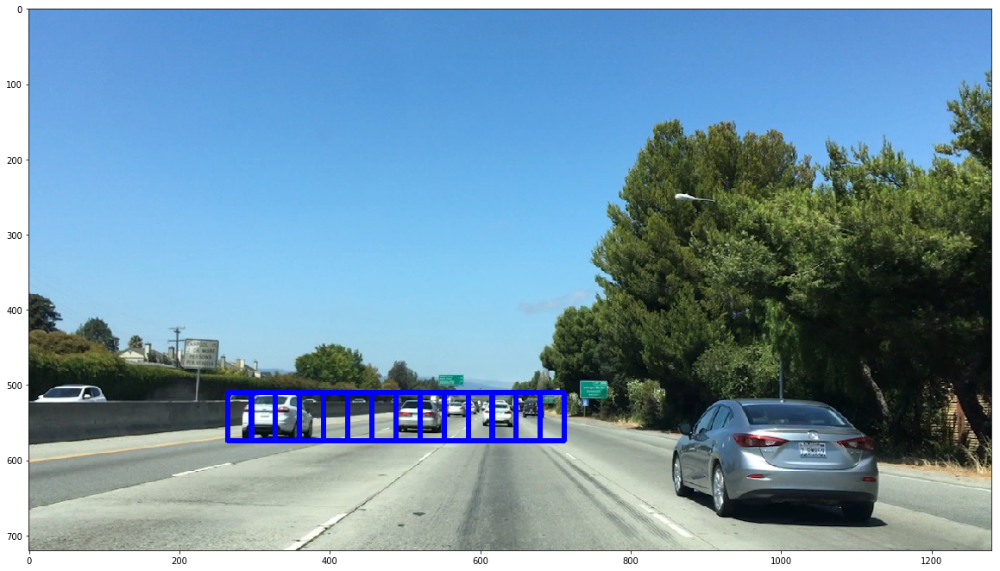

In [43]:
image = mpimg.imread('./lesson_images/cutouts/bbox-example-image.jpg')

windows = slide_window(image, 
                         x_start_stop=[264, 712], y_start_stop=[510, 574],
                         xy_window=(64, 64), xy_overlap=(0.5, 0.5))

print('Number of windows:',len(windows))
print(windows)

window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)
plt.figure(figsize=(20,20))
plt.imshow(window_img)

# Search and Classify
**This is a less-efficient method and is not yet implemented.**

Dumped from the Search and Classify module. **The functions within were renamed so as to not call functions defined above.**

<span style="color:green"><b>Code Cell 44</b></span>

...
Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 2580
8.06 Seconds to train SVC...
Test Accuracy of SVC =  0.9688
end


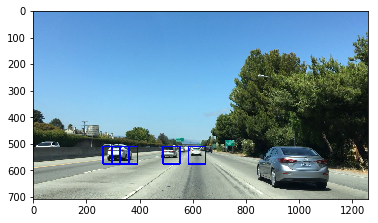

In [44]:
print('...')

# Define a function to compute binned color features  
def bin_spatial_sac(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist_sac(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial_sac() and color_hist_sac()
def extract_features_sac(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial_sac(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist_sac()
            hist_features = color_hist_sac(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features


# Define a function to extract features from a single image window
# This function is very similar to extract_features_sac()
# just for a single image rather than list of images
def single_img_features_sac(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial_sac(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist_sac(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows_sac(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features_sac()
        features = single_img_features_sac(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows
    
    
# # Read in cars and notcars
# images = glob.glob('*.jpeg')
# cars = []
# notcars = []
# for image in images:
#     if 'image' in image or 'extra' in image:
#         notcars.append(image)
#     else:
#         cars.append(image)

# # Reduce the sample size because
# # The quiz evaluator times out after 13s of CPU time
# sample_size = 500
# cars = cars[0:sample_size]
# notcars = notcars[0:sample_size]

##### Extraction and Training

### TODO: Tweak these parameters and see how the results change.
color_space = 'RGB' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()

car_features = extract_features_sac(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features_sac(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

#####

image = mpimg.imread('./lesson_images/bbox_example_image.jpg')
draw_image = np.copy(image)

# Uncomment the following line if you extracted training
# data from .png images (scaled 0 to 1 by mpimg) and the
# image you are searching is a .jpg (scaled 0 to 255)
image = image.astype(np.float32)/255

# windows = slide_window(image, x_start_stop=[None, None], y_start_stop=y_start_stop, 
#                     xy_window=(96, 96), xy_overlap=(0.5, 0.5))
windows = slide_window(image, x_start_stop=[264, 712], y_start_stop=[510, 574],
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5))

hot_windows = search_windows_sac(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

plt.imshow(window_img)
print('end')

# HOG Sub-Sampling Window Search
A more efficient (than the one in Search and Classify) for doing the sliding window approach, one that allows us to only have to extract the HOG features once.

## `convert_color()`

In [45]:
def convert_color(img, color_conv='RGB2YCrCb'):
    if color_conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if color_conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if color_conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if color_conv == 'RGB2HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if color_conv == 'RGB2HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if color_conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if color_conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if color_conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

## `extract_color_hist_features()`

In [46]:
def extract_color_hist_features(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

## `extract_bin_spatial_features()`

In [47]:
def extract_bin_spatial_features(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    
    return np.hstack((color1, color2, color3))

## `extract_hog_features()`

In [48]:
def extract_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        
        return features

## `extract_features()`
A function to extract features for training a classifier. The desire is to employ the same feature extraction techniques and parameters as are being using in the method to find cars.

<span style="color:green"><b>Code Cell 49</b></span>

In [49]:
def extract_features(imgs):
    # Arguments
    color_conv='RGB2YCrCb'
    bin_spatial_size=(32, 32)
    nhist_bins=32
    orient=9
    pix_per_cell=8
    cell_per_block=2
    hog_channel=0
    #vis=False
    #feature_vec=True
    
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    print_feature_information = True
    for file in imgs:
        # Read in each one by one
        image = mpimg.imread(file)
        
        # COLOR
        # Apply color conversion.
        feature_image = convert_color(image, color_conv)
    
        # COLOR HIST FEATURES
        color_hist_features = extract_color_hist_features(feature_image, nhist_bins)

        # BIN SPATIAL FEATURES
        bin_spatial_features = extract_bin_spatial_features(feature_image, bin_spatial_size)

        # HOG FEATURES
        ##### WORKING VERSION
        # Call return_hog_features() with vis=False, feature_vec=True
#         if hog_channel == 'ALL':
#             hog_features = []
#             for channel in range(feature_image.shape[2]):
#                 hog_features.append(extract_hog_features(feature_image[:,:,channel], 
#                                     orient, pix_per_cell, cell_per_block, 
#                                     vis=False, feature_vec=True))
#             hog_features = np.ravel(hog_features)        
#         else:
#             hog_features = extract_hog_features(feature_image[:,:,hog_channel], orient, 
#                         pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        ##### EXPERIMENTAL VERSION - NOW WORKS
        ch1 = feature_image[:,:,0]
        ch2 = feature_image[:,:,1]
        ch3 = feature_image[:,:,2]
        hog1 = extract_hog_features(ch1, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
        hog2 = extract_hog_features(ch2, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
        hog3 = extract_hog_features(ch3, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
        hog_feat1 = hog1[0:7, 0:7].ravel() 
        hog_feat2 = hog2[0:7, 0:7].ravel() 
        hog_feat3 = hog3[0:7, 0:7].ravel()
        hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
#         print('hog1.shape:',hog1.shape)
#         print('hog1[0][0][0][0][0]:',hog1[0][0][0][0][0])
#         print('hog2.shape:',hog2.shape)
#         print('hog3.shape:',hog3.shape)
#         print('color_hist_features.shape:',color_hist_features.shape)
#         print('bin_spatial_features.shape:',bin_spatial_features.shape)
#         print('hog_features.shape:',hog_features.shape)
        #####
        
        total_combined_features = np.concatenate((bin_spatial_features, color_hist_features, hog_features))

        # Add combined features to features collection.
        features.append(total_combined_features)
        
        if print_feature_information:
            print('*****Feature Information Using a Combination of All Feature Extraction Techniques')
            print('len(bin_spatial_features):',len(bin_spatial_features))
            print('spatial feature:',bin_spatial_features)
            print()
            print('len(color_hist_features):',len(color_hist_features))
            print('color_hist_features:',color_hist_features)
            print()
            print('len(hog_features):',len(hog_features))
            print('hog_features:',hog_features)
            print()
            print('len(features):',len(features))
            print('features:',features)
            print()
            print('len(features[0]):',len(features[0]))
            print('features[0]:',features[0])
            print('*****End of Feature Information')
            print_feature_information = False

    # Return list of feature vectors
    return features

### Extract Features

<span style="color:green"><b>Code Cell 50</b></span>

In [50]:
car_features = extract_features(cars)
notcar_features = extract_features(notcars)

*****Feature Information Using a Combination of All Feature Extraction Techniques
len(bin_spatial_features): 3072
spatial feature: [ 0.64251769  0.63803136  0.62628829 ...,  0.46668637  0.46423686
  0.46276712]

len(color_hist_features): 96
color_hist_features: [ 20 102 243 278 205 229 207 302 250 224 205 161 139 101 132  81 114 204
 275 189 104  75  41  38  35  47  29  16  14   8  16  12  24  48  92 101
 142 133 122 103 152 194 241 261 253 305 234 240 194 240 242 285 236  94
  31  24  22  20  19  26   5   6   2   5   6  33  76  65  91 129 237 173
 247 115 129  95 125 115 123 117 114 157 141 183 180 215 128 207 168 277
 206 142  47  32  19   4]

len(hog_features): 5292
hog_features: [ 0.02695588  0.04260542  0.00810073 ...,  0.          0.00559385
  0.01684478]

len(features): 1
features: [array([ 0.64251769,  0.63803136,  0.62628829, ...,  0.        ,
        0.00559385,  0.01684478])]

len(features[0]): 8460
features[0]: [ 0.64251769  0.63803136  0.62628829 ...,  0.          0.005593

### Train on Features and Output Results
<span style="color:green"><b>Code Cell 51</b></span>

StandardScaler(copy=True, with_mean=True, with_std=True)
values: None None None None None
USING ONLY COLOR FEATURES

Feature vector length: 8460
130.96 Seconds to train SVC...
Test Accuracy of SVC =  0.993
The SVC predicts:     [ 1.  0.  0.  1.  0.  1.  1.  0.  0.  1.]
for these 10 labels:  [ 1.  0.  0.  1.  0.  1.  1.  0.  0.  1.]
0.31175 seconds to predict 10 labels with SVC

A random car, its raw features, its scaled featues...

The SVC predicts this is a car.


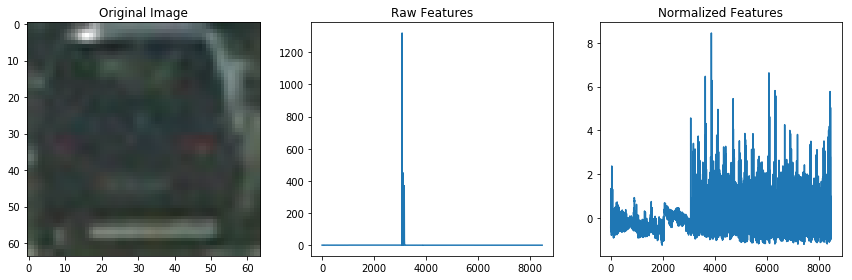

In [51]:
X_scaler, svc = analyze_and_output(car_features,notcar_features)

Exercises to demonstrate parts of `get_cars()`

Get an image from the car's front-facing camera.

img.shape: (720, 1280, 3)


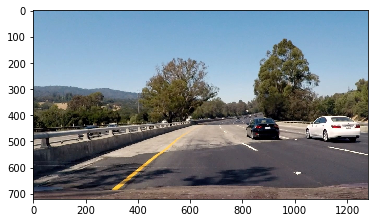

In [52]:
img = mpimg.imread('./test_images/test4.jpg')
draw_img = np.copy(img)
plt.imshow(draw_img)

print('img.shape:',img.shape)

Crop the input image to a region of interest based on the `ystart` and `ystop` parameters of `find_cars()`.

ystart: 400
ystop: 528

img_tosearch: (128, 1280, 3)


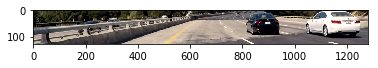

In [53]:
ystart = 400
ystop = 528#656

img_tosearch = img[ystart:ystop,:,:]
plt.imshow(img_tosearch)

print('ystart:',ystart)
print('ystop:',ystop)
print()
print('img_tosearch:',img_tosearch.shape)

Change the color space of the image based on the `color_space` parameter of `find_cars()`

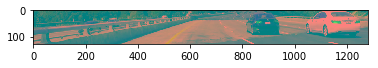

In [54]:
ctrans_tosearch = convert_color(img_tosearch, color_conv='RGB2YCrCb')
plt.imshow(ctrans_tosearch)

Scale the image (or not) given the `find_cars()` parameter `scale`.

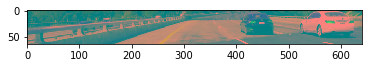

In [55]:
scale = 2#1.5
imshape = ctrans_tosearch.shape
ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
plt.imshow(ctrans_tosearch)

Display the color channels of the image.

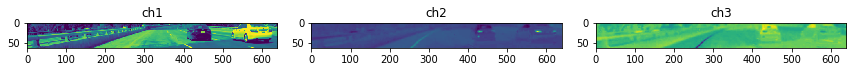

In [56]:
ch1 = ctrans_tosearch[:,:,0]
ch2 = ctrans_tosearch[:,:,1]
ch3 = ctrans_tosearch[:,:,2]

fig = plt.figure(figsize=(12,3))
plt.subplot(131)
plt.imshow(ch1)
#plt.bar(bincen, rh[0])
#plt.xlim(0, 256)
plt.title('ch1')

plt.subplot(132)
plt.imshow(ch2)
#plt.bar(bincen, gh[0])
#plt.xlim(0, 256)
plt.title('ch2')

plt.subplot(133)
plt.imshow(ch3)
#plt.bar(bincen, bh[0])
#plt.xlim(0, 256)
plt.title('ch3')

fig.tight_layout()

Define blocks and steps given the `get_cars()` parameter, `pix_per_cell`.

In [57]:
pix_per_cell = 8

image_width = ctrans_tosearch.shape[1]
image_height = ctrans_tosearch.shape[0]
nxblocks = (image_width // pix_per_cell)-1
nyblocks = (image_height // pix_per_cell)-1

print('pix_per_cell:',pix_per_cell)
print('image_width:',image_width)
print('image_height:',image_height)
print('nxblocks:',nxblocks)
print('nyblocks:',nyblocks)

pix_per_cell: 8
image_width: 640
image_height: 64
nxblocks: 79
nyblocks: 7


The number of features per block given the `get_cars()` parameters, `orient` and `cell_per_block`.

<span style="color:green"><b>Code Cell 58</b></span>

In [58]:
orient = 9
cell_per_block = 2

nfeat_per_block = orient*cell_per_block**2

print('orient:',orient)
print('cell_per_block:',cell_per_block)
print('nfeat_per_block:',nfeat_per_block)

orient: 9
cell_per_block: 2
nfeat_per_block: 36


<span style="color:green"><b>Code Cell 59</b></span>

In [59]:
window = 64

nblocks_per_window = (window // pix_per_cell)-1 
cells_per_step = 2  # Instead of overlap, define how many cells to step
nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
nysteps = (nyblocks - nblocks_per_window) // cells_per_step

print('window:',window)
print('nblocks_per_window:',nblocks_per_window)
print('cells_per_step:',cells_per_step)
print('nxsteps:',nxsteps)
print('nysteps:',nysteps)

window: 64
nblocks_per_window: 7
cells_per_step: 2
nxsteps: 36
nysteps: 0


## `find_cars()`
From the Hog Sub-sampling Window Search module. A single function that can extract features using HOG sub-sampling and make predictions. The function returns either all search windows used (`all_search_windows=True`) or the search windows where a car is suspected to have been found (`all_search_windows=False`).

Searches for cars need to be conducted and various y-ranges and scales to identify cars located at various points along the perspective tunnel.

<span style="color:green"><b>Code Cell 60</b></span>

In [60]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, 
                   spatial_size, hist_bins, all_search_windows=False):
    
    # 
    search_windows = []
    
    # Image on which to draw boxes.
#     draw_img = np.copy(img)

    # PNG TRAINING IMAGES JPG INPUT IMAGE
    # Uncomment the following line if training data was from .png images (scaled 0 to 1by mpimg)
    # and the image being searched is a .jpg (scaled 0 to 255).
    img = img.astype(np.float32)/255
    
    # Create an image from a vertical band of the original image.
    # This image will essentially have the sky and the car's hood cut out of the image.
    # This provides a much smaller area in which to search for cars.
    img_tosearch = img[ystart:ystop,:,:]
    # COLOR
    # Convert the image to the desired color space.
    ctrans_tosearch = convert_color(img_tosearch, color_conv='RGB2YCrCb')
    # SCALE
    # Resize the image if the search scale is anything other than 1.
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    # Get the color channels of the image.
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    image_height = ctrans_tosearch.shape[0]
    image_width = ctrans_tosearch.shape[1]
    # Number of blocks in the x-direction.
    nxblocks = (image_width // pix_per_cell)-1
    # Number of blocks in the y-direction.
    nyblocks = (image_height // pix_per_cell)-1
    # Number of features per block.
    nfeat_per_block = orient*cell_per_block**2
    # 64x64 was the orginal window sample (the size of images).
    # With 8 pix per cell, that results in 8 cells per window or image area.
    window = 64
    # Number of blocks per window.
    nblocks_per_window = (window // pix_per_cell)-1
    # Instead of overlap, define how many cells to step
    cells_per_step = 2
    # Number of steps in the x-direction.
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    # Number of steps in the y-direction.
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image.
    # def hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    hog1 = extract_hog_features(ch1, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
    hog2 = extract_hog_features(ch2, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
    hog3 = extract_hog_features(ch3, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False)
#     print('len(hog1):',len(hog1))
#     print('hog1:',hog1)
#     print('len(hog2):',len(hog2))
#     print('len(hog3):',len(hog3))
#     print('hog1.shape:',hog1.shape)
#     print('hog2.shape:',hog2.shape)
#     print('hog3.shape:',hog3.shape)
    # In the lesson, hog1.shape is: (20, 105, 2, 2, 9)
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
#             print('ypos:',ypos)
#             print('ypos+nblocks_per_window:',ypos+nblocks_per_window)
#             print('xpos:',xpos)
#             print('xpos+nblocks_per_window:',xpos+nblocks_per_window)

            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

            # Get color features
            spatial_features = extract_bin_spatial_features(subimg, size=spatial_size)
            hist_features = extract_color_hist_features(subimg, nbins=hist_bins)
            
#             print('len(spatial_features):',len(spatial_features))
#             print('len(hist_features):',len(hist_features))
#             print('len(hog_features):',len(hog_features))

            #####
#             print('spatial_features.shape:',spatial_features.shape)
#             print('hist_features.shape:',hist_features.shape)
#             print('hog_features.shape:',hog_features.shape)
#             print('X_scaler:',X_scaler)
#             z = np.hstack((spatial_features, hist_features, hog_features))
#             print('z.shape:',z.shape)
#             print('z:',z)
            #####

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))

#             #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
#             #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
#             #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
#             #test_prediction = svc.predict(test_features)
#             z = np.vstack((spatial_feat, hist_feat, hog_features)).astype(np.float64)
#             test_features = X_scaler.transform(z)
#             #             print('X')
#             #             print('svc:',svc)

            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1 or all_search_windows:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale) # The 64x64 search window is scaled.
                search_windows.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
#                 if test_prediction == 1:
#                     cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
    
#     return draw_img, search_windows
    return search_windows

## Determine Suitable Ranges and Scales

Test Images


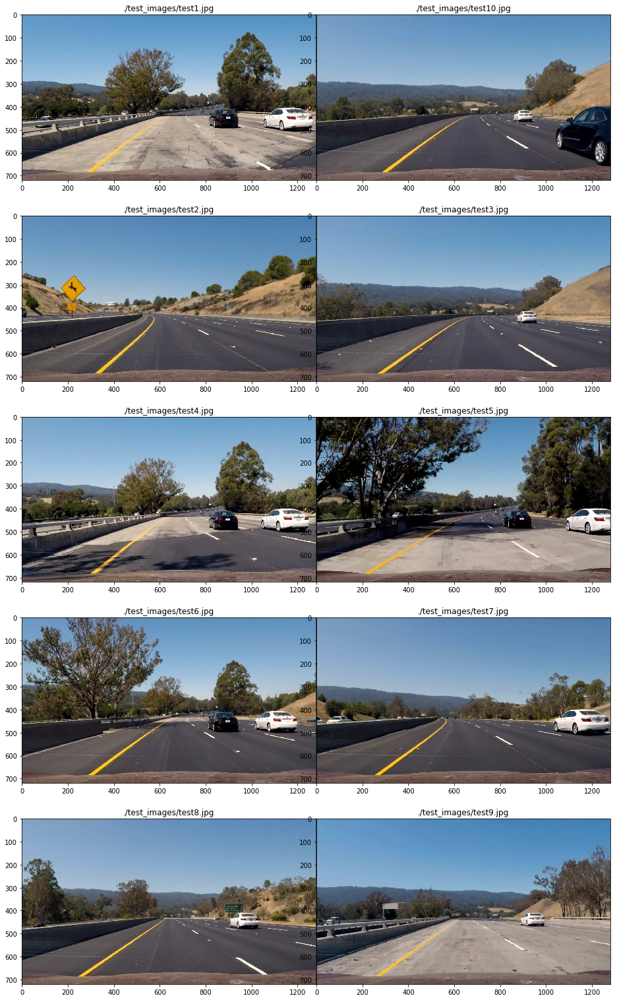

In [61]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(5, 2, figsize=(16,28))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
#     axs[i].imshow(process_frame(mpimg.imread(im)))
    axs[i].imshow(mpimg.imread(im))
    axs[i].set_title(im)
#     axs[i].axis('off')

print('Test Images')

Investigate test images individually to get a feel for the algorithm.

Image shape: (720, 1280, 3)
Investigate Image to Determine Various Regions and Scales


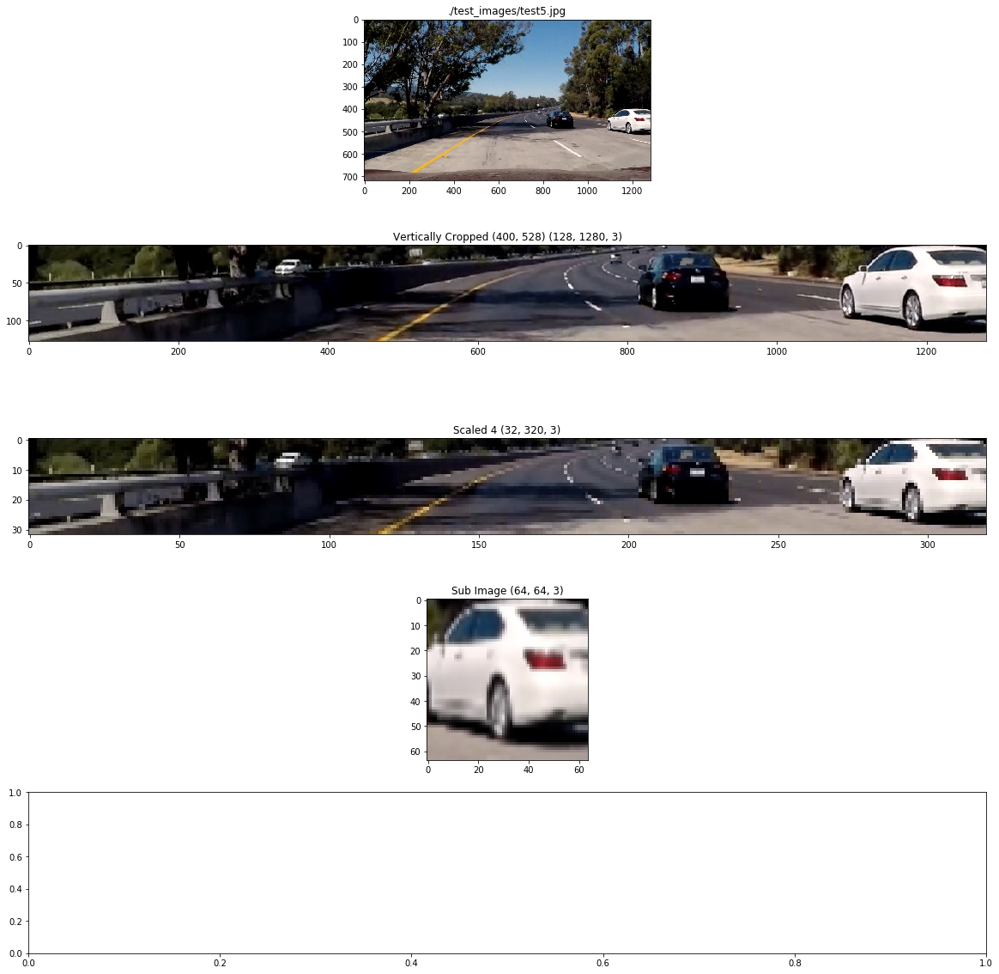

In [62]:
# Investigate the images individually.
image_title = './test_images/test5.jpg'
image = np.copy(mpimg.imread('./test_images/test5.jpg'))
image_shape = image.shape
print('Image shape:',image_shape)
# img = mpimg.imread(img_title)

# Crop vertically...
y_start = 400
y_stop = 528#656
y_range = (400,528)
cropped_image = image[y_range[0]:y_range[1],:,:]
cropped_image_shape = cropped_image.shape

# Scale the image to accommodate the 64x64 pixel search window.
# toggle between 4 and 3 to pick up the white or black car
image_scale = 4#3#1.5
cropped_image_shape = cropped_image.shape
scaled_image = cv2.resize(cropped_image, 
                                (np.int(cropped_image_shape[1]/image_scale), 
                                 np.int(cropped_image_shape[0]/image_scale)))
scaled_image_shape = scaled_image.shape

# Extract the image patch.
window=64
ytop=0
xleft=275
sub_image = cv2.resize(scaled_image[ytop:ytop+window, xleft:xleft+window], (64,64))
sub_image_shape = sub_image.shape

# # 64x64 rectangle representing the 64x64 pixel search window.
# trc=(320,-10)
# blc=(trc[0]+64,trc[1]+64)
# cv2.rectangle(scaled_image, trc, blc, (255,0,0), 2)

# Plot image.
# plt.figure(figsize=(20,20))
# plt.imshow(img_tosearch)
# print('Original image shape:',image_shape)
fig, axs = plt.subplots(5, 1, figsize=(20,20))
# fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()
axs[0].imshow(image)
axs[0].set_title(image_title)
axs[1].imshow(cropped_image)
axs[1].set_title('Vertically Cropped %s %s' % (y_range,cropped_image_shape,))
axs[2].imshow(scaled_image)
axs[2].set_title('Scaled %s %s' % (image_scale,scaled_image_shape,))
axs[3].imshow(sub_image)
axs[3].set_title('Sub Image %s' % (sub_image_shape,))

print('Investigate Image to Determine Various Regions and Scales')

Run and Display the Output of `find_cars()` for a single image, single range, single scale.

<span style="color:green"><b>Code Cell 63</b></span>

In [63]:
test_image = mpimg.imread('./test_images/test5.jpg')

orient = 9
pix_per_cell = 8
cell_per_block = 2
spatial_size = (32, 32)
hist_bins = 32

ystart = 400
ystop = 656
scale = 1.5

positive_search_windows = find_cars(test_image, ystart, ystop, scale, svc, X_scaler, orient,
                                    pix_per_cell, cell_per_block, spatial_size, 
                                    hist_bins,all_search_windows=False)

plt.figure(figsize=(20,20))
print('orient:',orient)
print('pix_per_cell:',pix_per_cell)
print('cell_per_block:',cell_per_block)
print('spatial_size:',spatial_size)
print('hist_bins:',hist_bins)
print()
print('Number of positive_search_windows found in the image:',len(positive_search_windows))

orient: 9
pix_per_cell: 8
cell_per_block: 2
spatial_size: (32, 32)
hist_bins: 32

Number of positive_search_windows found in the image: 9


`draw_search_windows()`
Use this function to draw search windows. Randomized color will help to distiquish the various search windows.

In [64]:
def draw_search_windows(img, search_windows, color=(0, 0, 255), thick=2):
    imgcopy = np.copy(img)
    use_random_color = False
    for search_window in search_windows:
        if color == 'random' or use_random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            use_random_color = True
        # Draw search window.
        cv2.rectangle(imgcopy, search_window[0], search_window[1], color, thick)
    
    return imgcopy

Display the search windows on the image which they were used.

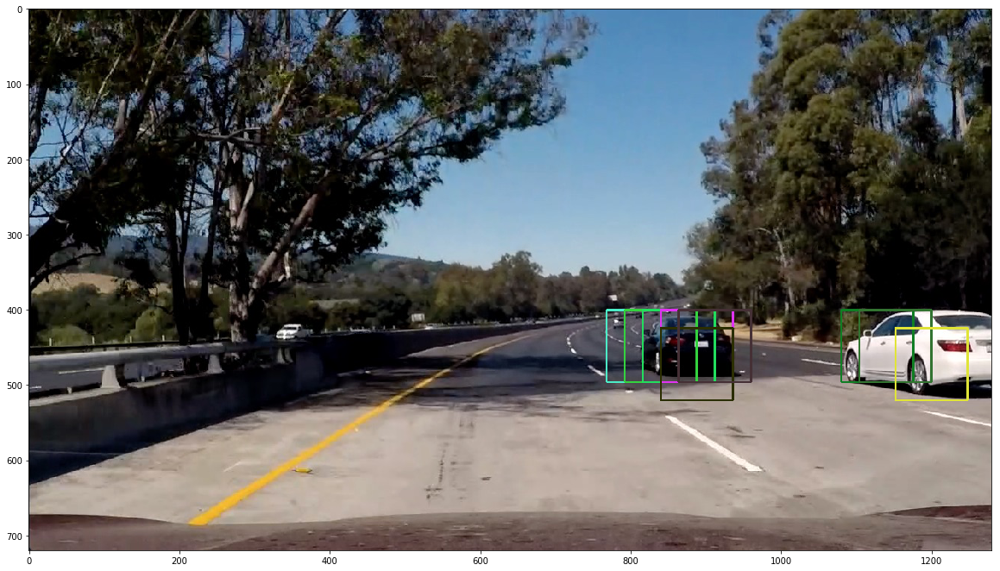

In [65]:
output_image = draw_search_windows(test_image, positive_search_windows, color='random')
plt.figure(figsize=(20,20))
plt.imshow(output_image)

# Moving Forward, in these Next Few Cells...
* Establish Suitable Regions and Scales at Which to Search for Vehicles
* Using the Numerous and Varied Positive Search Windows, Create a Heatmap
* Apply Thresholds to the Heatmaps
* Draw Bounding Boxes for Labels

## Establish Suitable Regions and Scales at Which to Search for Vehicles

### Experiment with Various Video Frames to Establish Search Region and Window Scale

`process_video_frame_0()` Given an image frame from a video (or any image), return all positive search windows.

[flatten a list of lists - stackoverflow](http://stackoverflow.com/questions/952914/making-a-flat-list-out-of-list-of-lists-in-python)

In [66]:
def process_video_frame_0(img):
    # positive search windows
    psw = []

    # Common to each search...
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    spatial_size = (32, 32)
    hist_bins = 32

    # Searches at different ranges and scales...
    ystart = 400
    ystop = 656
    scale = 1.5
    psw.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, 
                                        cell_per_block, spatial_size, hist_bins))

    return psw

9


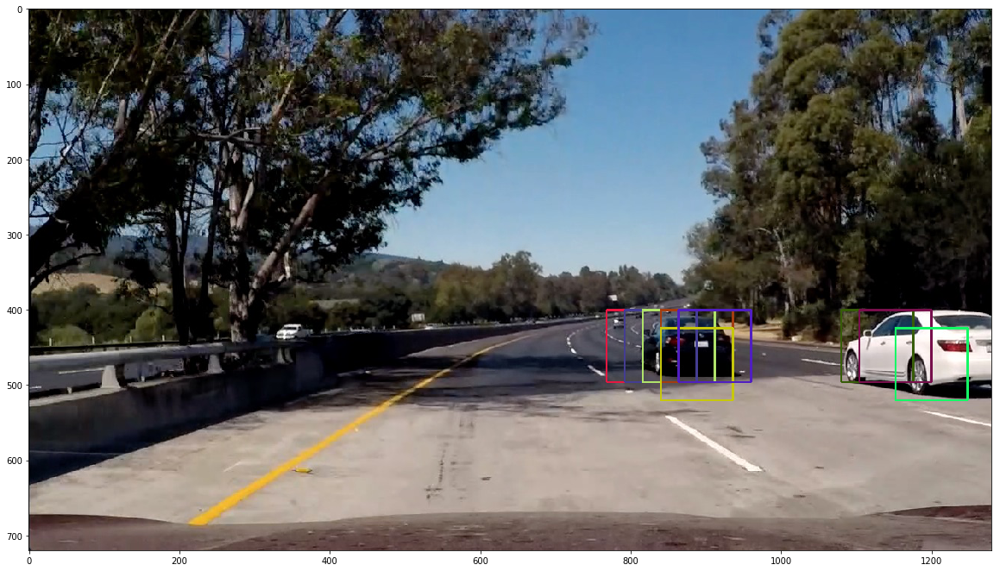

In [67]:
test_image = mpimg.imread('./test_images/test5.jpg')

psw = process_video_frame_0(test_image)
print(len(psw[0]))

output_image = draw_search_windows(test_image, psw[0], color='random', thick=2)
plt.figure(figsize=(20,20))
plt.imshow(output_image)

# Multiple Detections & False Positives

## `add_heat()`
This function takes the collection of positive search windows and a zeroed-out image of the video frame or image with cars; this means it is a blank image. Everywhere there is a positive search window, it advances the third value of the image array by one. Where positive search windows overlap, the count will be higher due to accumulation, thus creating a heatmap of areas with high detection. It is assumed that an area with a higher concentration of positive search windows is more likely to contain a car than one that has a lower concentration of positive search windows. This will allow implementing a threshold to weed-out false positives that may have been detected.

<span style="color:green"><b>Code Cell 68</b></span>

In [68]:
def add_heat(heatmap_image, all_psw):
    # Iterate through list of positive search windows.
    for psw in all_psw:
        # psw is of the form: ((top-left-corner), (bottom-right-corner))
        # psw is of the form: ((192, 400), (288, 496)), where
        # psw[0][0]: 192
        # psw[0][1]: 400
        # psw[1][0]: 288
        # psw[1][1]: 496
        # Each of these is an empty, outlined, positive search window
        # (one where a car was detected).
        #print(heatmap_image[450,900])
        heatmap_image[psw[0][1]:psw[1][1], psw[0][0]:psw[1][0]] += 1
        #print(heatmap_image[450,900])
        #print()
   
    return heatmap_image

## Run and Display output of `add_heat()`

Heatmap


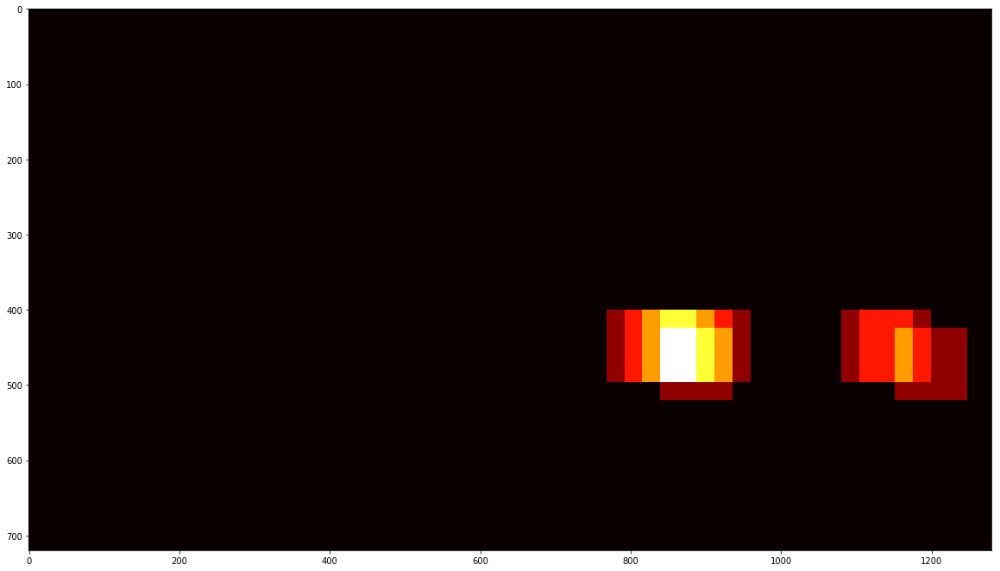

In [69]:
# Return an array of zeros with the same shape and type as a given array.
heatmap_image = np.zeros_like(test_image[:,:,0])
# Using the collection of positive search windows, create an image representing areas
# of higher probability for a car detection.
heatmap_image = add_heat(heatmap_image, psw[0])
# Plot.
plt.figure(figsize=(20,20))
plt.imshow(heatmap_image, cmap='hot')

print('Heatmap')

## `apply_threshold()`
This function applies a threshold to the heatmap, which provides for the removal of areas of low probability for a positive car detection.

<span style="color:green"><b>Code Cell 70</b></span>

In [70]:
def apply_threshold(heatmap_image, threshold):
    # Zero-out pixels below the threshold.
    heatmap_image[heatmap_image <= threshold] = 0
    
    return heatmap_image

## Display the Thresholded Heatmap

Thresholded Heatmap


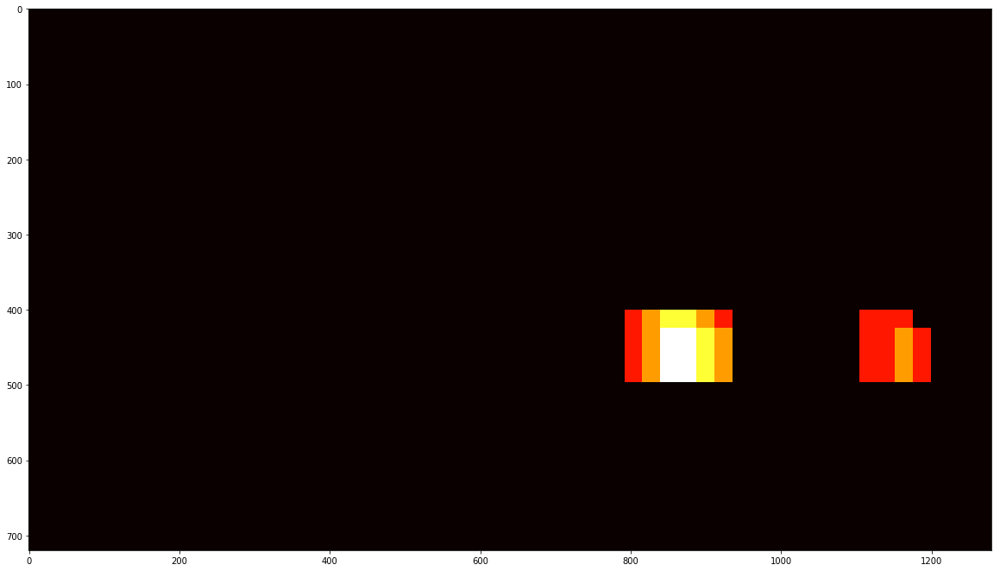

In [71]:
thresholded_heatmap_image = apply_threshold(heatmap_image, 1)
# Plot
plt.figure(figsize=(20,20))
plt.imshow(thresholded_heatmap_image, cmap='hot')

print('Thresholded Heatmap')

## SciPy Label the Thresholded Heatmap
Returns an integer ndarray where each unique feature in input has a unique label in the returned array and how many object were found.

Number of cars found: 2


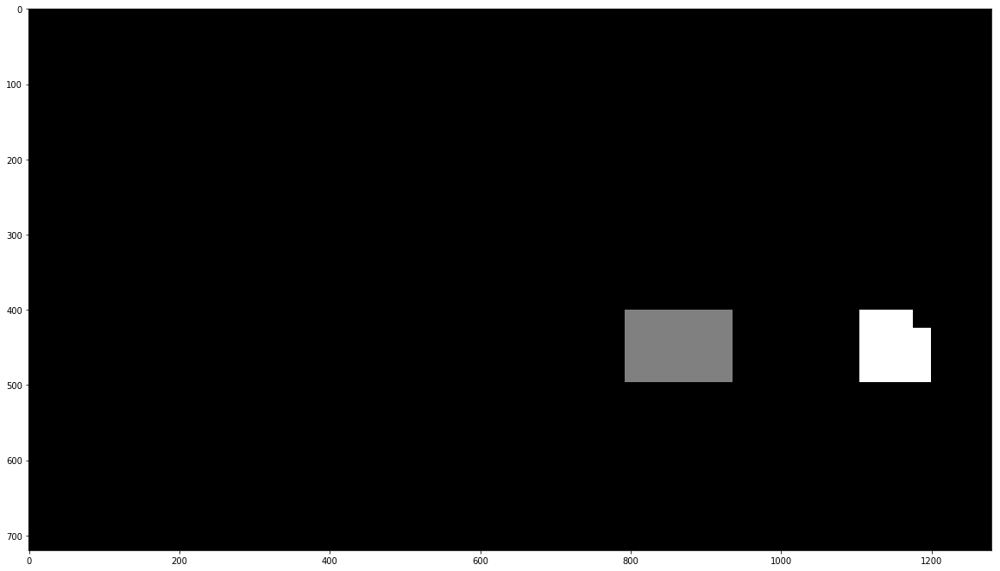

In [72]:
labels = label(thresholded_heatmap_image)
# Plot
plt.figure(figsize=(20,20))
plt.imshow(labels[0], cmap='gray')
print('Number of cars found:', labels[1])

## `bounding_boxes()`
This function takes the image and labels and returns the image with bounding boxes drawn and the collection of bounding boxes.

In [73]:
def bounding_boxes(img, labels):
    all_bboxes = []
    for car in range(1, labels[1]+1):
        # Non-zero pixels for each car (label).
        nonzero = (labels[0] == car).nonzero()
        # Identify the x and y values of those non-zero pixels corresponding to a car.
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y.
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        all_bboxes.append(bbox)
        # Draw the bounding box on the image.
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 2)
    
    return img, all_bboxes

## Display Output of `bounding_boxes()`

<span style="color:green"><b>Code Cell 74</b></span>

Detected Vehicles


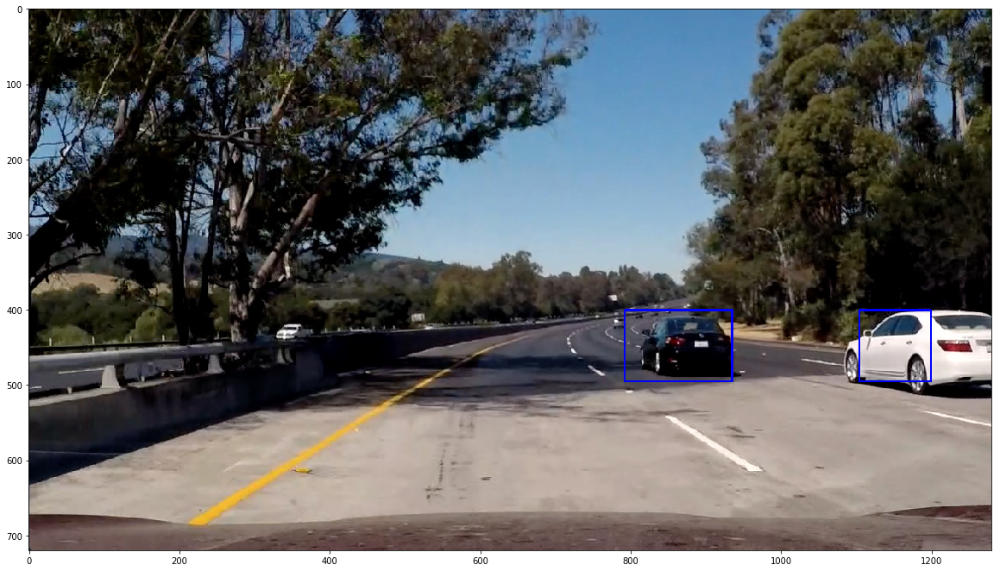

In [74]:
# Draw bounding boxes on a copy of the image
output_image, bboxes = bounding_boxes(np.copy(test_image), labels)
# Plot
plt.figure(figsize=(20,20))
plt.imshow(output_image)

print('Detected Vehicles')

# Positive Search Windows and Heatmaps for Six Frames

## Extract Frames from Project Video
This cell was used to extract and output video frames for analysis and testing.

## `Positive_Search_Windows`
A class to collect and track the last number of all positive search windows. This will be used to smooth-out the bounding boxes as the ultimate result will be over a number of video frames rather than individual frames, which could prove to be choppy and inaccurate. This is similar to what was done in Project 4, Advanced Lane Finding.

In [93]:
class Positive_Search_Windows():
    def __init__(self):
        # history of rectangles previous n frames
        self.psw = [] 
        
    def add_psw(self, positive_search_windows):
        self.psw.append(positive_search_windows)
        nbuffer = 15
        if len(self.psw) > nbuffer:
            # throw out oldest rectangle set(s)
            # Cull the collection; keeping the latest (FIFO).
            self.psw = self.psw[len(self.psw)-nbuffer:]

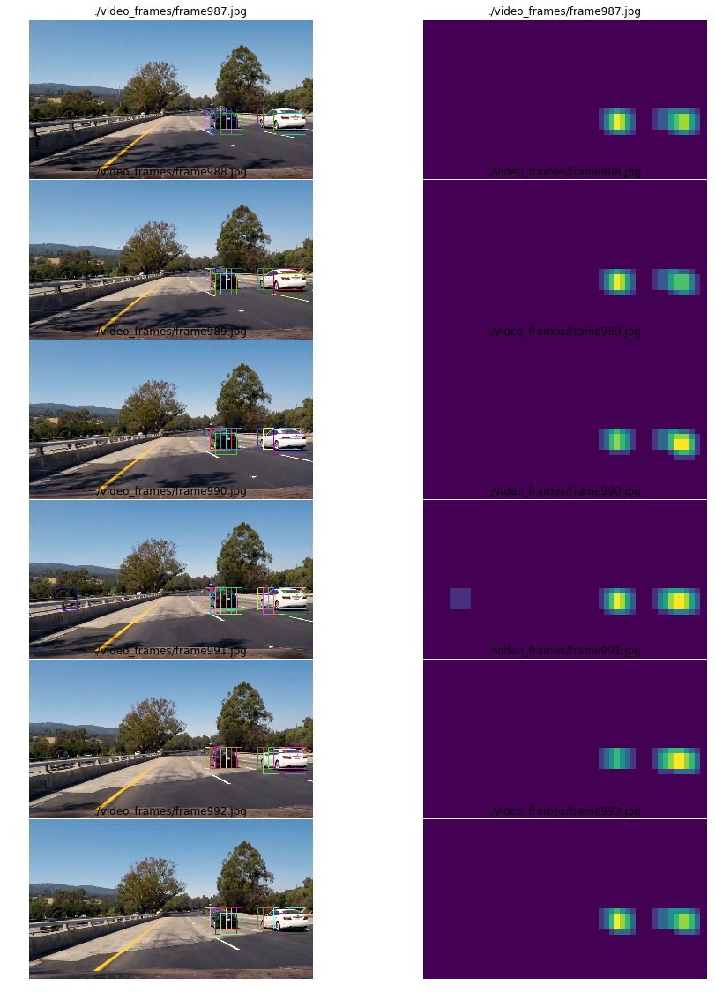

In [96]:
video_frame_names = glob.glob('./video_frames/frame*.jpg')

psw_object = Positive_Search_Windows()

# Plot
# fig, axs = plt.subplots(6, 2, figsize=(16,28))
fig, axs = plt.subplots(6, 2, figsize=(16,20))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

i=0
for name in enumerate(video_frame_names):
    img = mpimg.imread(name[1])
    psw = process_video_frame_0(img)
    bbox_image = draw_search_windows(img, psw[0], color='random', thick=2)
    axs[i].axis('off')
    axs[i].set_title(name[1])
    axs[i].imshow(bbox_image)
    i += 1
    # Return an array of zeros with the same shape and type as a given array.
    heatmap_image = np.zeros_like(img[:,:,0])
    # Using the collection of positive search windows, create an image representing areas
    # of higher probability for a car detection.
    heatmap_image = add_heat(heatmap_image, psw[0])
    axs[i].axis('off')
    axs[i].set_title(name[1])
    axs[i].imshow(heatmap_image)
    i += 1
    
    # Collect positive search window data.
    if len(psw[0]) > 0:
        psw_object.add_psw(psw[0])

In [77]:
print(len(psw_object.psw))
print(psw_object.psw[0])

6
[((792, 400), (888, 496)), ((816, 400), (912, 496)), ((816, 424), (912, 520)), ((840, 400), (936, 496)), ((840, 424), (936, 520)), ((864, 400), (960, 496)), ((864, 424), (960, 520)), ((1032, 400), (1128, 496)), ((1056, 400), (1152, 496)), ((1104, 400), (1200, 496)), ((1104, 424), (1200, 520)), ((1128, 400), (1224, 496)), ((1128, 424), (1224, 520)), ((1152, 400), (1248, 496)), ((1152, 424), (1248, 520))]


## Integrated Heatmap Label Output

Number of cars found: 2


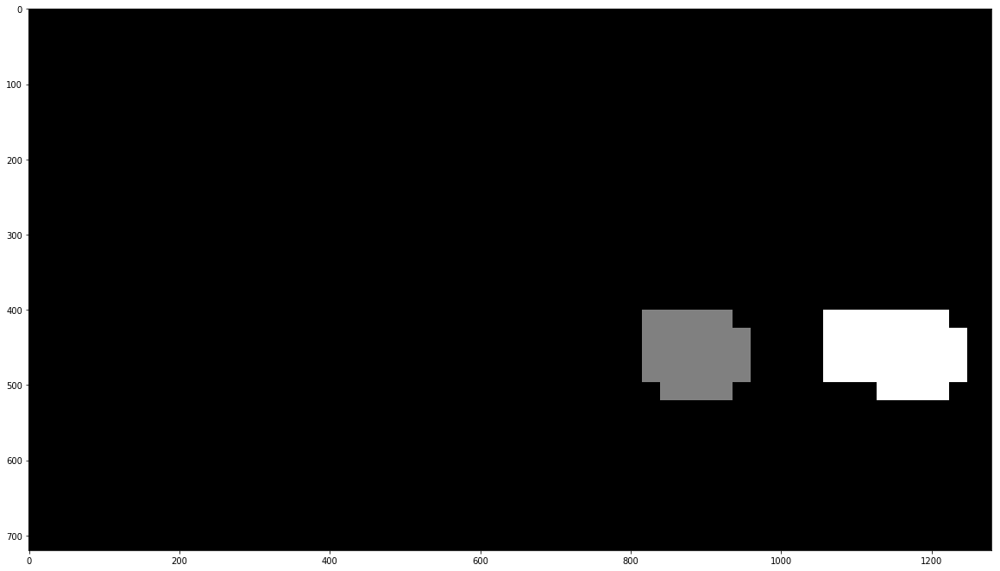

In [78]:
# Return an array of zeros with the same shape and type as a given array.
heatmap_image = np.zeros_like(test_image[:,:,0])
# Using the collection of positive search windows, create an image representing areas
# of higher probability for a car detection.
heatmap_image = add_heat(heatmap_image, psw_object.psw[0])
# # Plot.
# plt.figure(figsize=(20,20))
# plt.imshow(heatmap_image, cmap='hot')

thresholded_heatmap_image = apply_threshold(heatmap_image, 1)
# # Plot
# plt.figure(figsize=(20,20))
# plt.imshow(thresholded_heatmap_image, cmap='hot')

labels = label(thresholded_heatmap_image)
# Plot
plt.figure(figsize=(20,20))
plt.imshow(labels[0], cmap='gray')
print('Number of cars found:', labels[1])

## Draw Bounding Boxes onto the Last Frame

Detected Vehicles


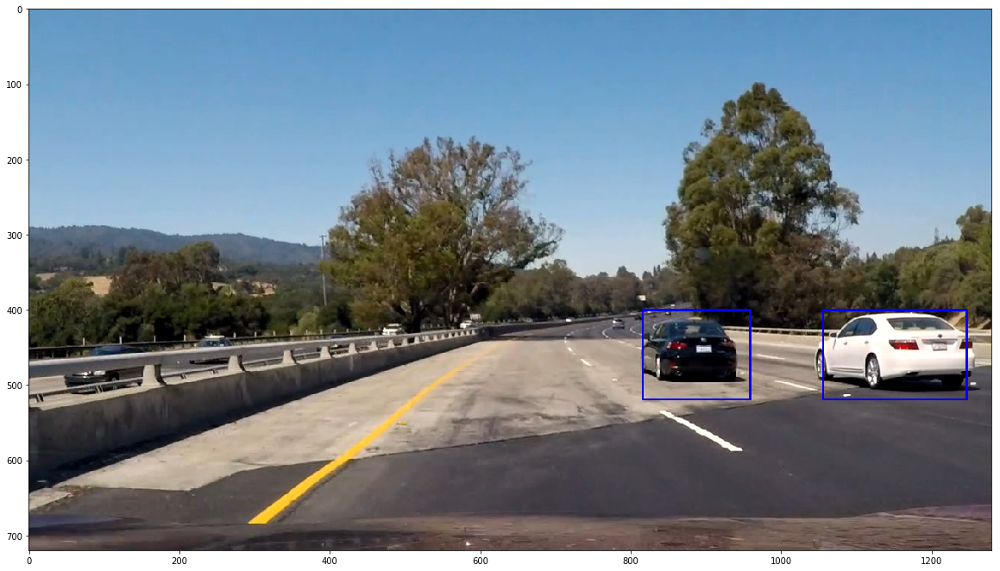

In [79]:
last_frame = mpimg.imread('./video_frames/frame992.jpg')

# Draw bounding boxes on a copy of the image
output_image, bboxes = bounding_boxes(np.copy(last_frame), labels)
# Plot
plt.figure(figsize=(20,20))
plt.imshow(output_image)

print('Detected Vehicles')

# `process_frame_1()`
This function processes an image to detected a car(s) and encapsulate it/them in a bounding box(es). It returns the image with the bounding boxes drawn.

<span style="color:green"><b>Code Cell 80</b></span>

In [85]:
def process_frame_1(img):
    psw = [] # positive search windows
    
    # Common to all searches.
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    spatial_size = (32, 32)
    hist_bins = 32

    # Unique to a particular search.
    ystart = 400
    ystop = 656
    scale = 1.5
    psw.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, 
                                        cell_per_block, spatial_size, hist_bins))
    
    # Could search other regions and scales...

    # Flatten the collection.
    psw = [item for sublist in psw for item in sublist]
    
    # Process, using the image and positive search windows.
    heatmap_img = np.zeros_like(img[:,:,0])
    heatmap_img = add_heat(heatmap_img, psw)
    heatmap_img = apply_threshold(heatmap_img, 1)
    labels = label(heatmap_img)
    draw_img, bboxes = bounding_boxes(np.copy(img), labels)

    return draw_img

## Display Output of `process_frame()_1` for Test Images

./test_images/test1.jpg
./test_images/test10.jpg
./test_images/test2.jpg
./test_images/test3.jpg
./test_images/test4.jpg
./test_images/test5.jpg
./test_images/test6.jpg
./test_images/test7.jpg
./test_images/test8.jpg
./test_images/test9.jpg


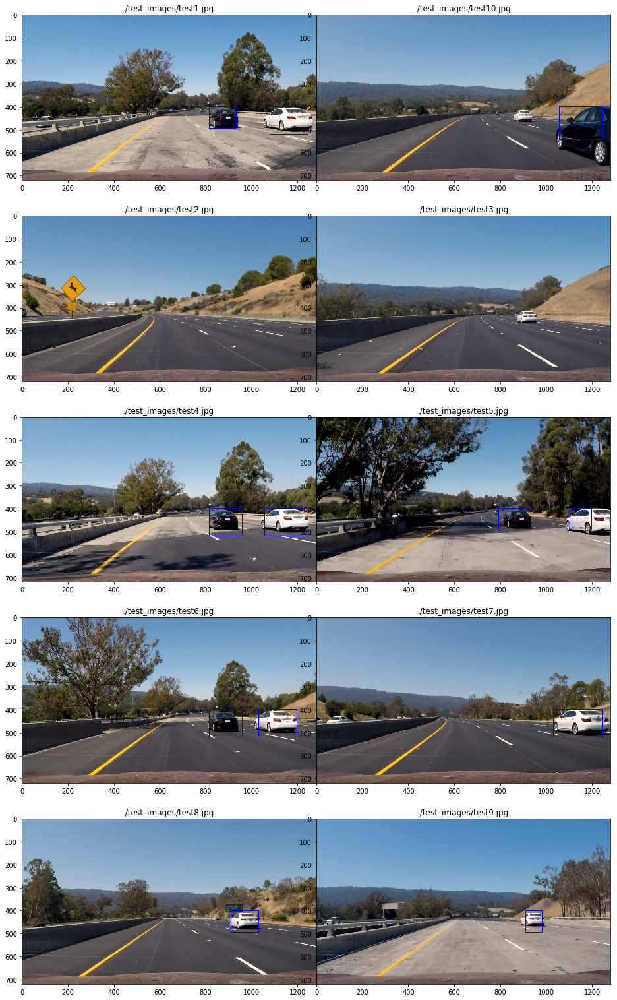

In [86]:
test_images = glob.glob('./test_images/test*.jpg')

# Plot
fig, axs = plt.subplots(5, 2, figsize=(16,28))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    print(im)
    axs[i].imshow(process_frame_1(mpimg.imread(im)))
#     axs[i].axis('off')
    axs[i].set_title(im)

# `process_frame()`
This version takes into account integration of data over a numbe of frames, resulting in a more accurate and smoother depiction of detection.

<span style="color:green"><b>Code Cell 82</b></span>

In [91]:
def process_frame(img):
    psw = [] # positive search windows
    
    # Common to all searches.
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    spatial_size = (32, 32)
    hist_bins = 32

    # Unique to a particular search.
    ystart = 400
    ystop = 656
    scale = 1.5
    psw.append(find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, 
                                        cell_per_block, spatial_size, hist_bins))
    
    # Could search other regions and scales...

    # Flatten the collection.
    psw = [item for sublist in psw for item in sublist]
    
    # Take into account the accumulation of positive search windows
    # over a number of frames.
    if len(psw) > 0:
        psw_object.add_psw(psw)
    
    # Process, using the image and positive search windows.
    heatmap_img = np.zeros_like(img[:,:,0])
    
    # For all of the positive searach windows over a number of frames...
    for positive_search_windows in psw_object.psw:
        heatmap_img = add_heat(heatmap_img, positive_search_windows)
    heatmap_img = apply_threshold(heatmap_img, 1 + len(psw_object.psw)//2)
    
    labels = label(heatmap_img)
    draw_img, bboxes = bounding_boxes(np.copy(img), labels)

    return draw_img

# Process Project Video

In [94]:
psw_object = Positive_Search_Windows()

video_output = 'project_video_output.mp4'
video_input = VideoFileClip('project_video.mp4')
processed_video = video_input.fl_image(process_frame)
%time processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



100%|█████████▉| 1260/1261 [06:11<00:00,  3.50it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 46s, sys: 16.2 s, total: 6min 2s
Wall time: 6min 12s


In [95]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(video_output))